In [1]:
import numpy as np
import cv2
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog

In [2]:
import prepare_data
import imp
imp.reload(prepare_data)

<module 'prepare_data' from '/Users/pbanavara/dev/udacity_sdcar/udacity_vehicle_detect/CarND-Vehicle-Detection/src/prepare_data.py'>

In [3]:
d, car_list, notcar_list = prepare_data.data_look()

../../data/vehicles/KITTI_extracted/1255.png


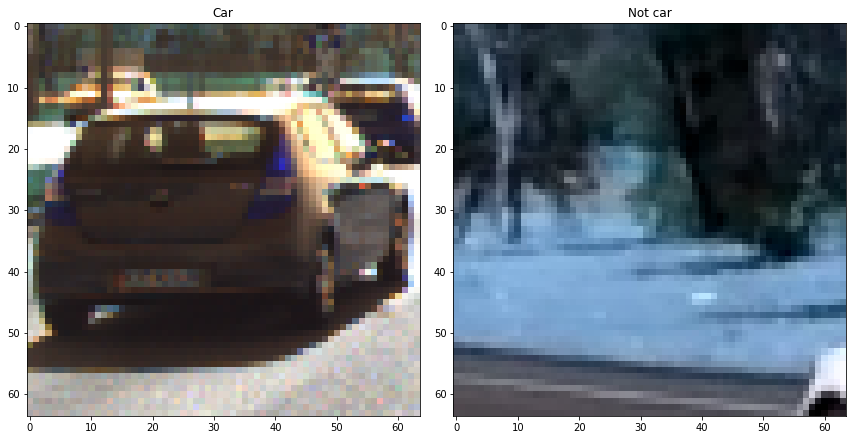

In [78]:
import random
c_image = random.sample(car_list, 1)
nc_image = random.sample(notcar_list, 1)
print(c_image[0])
fig = plt.figure()
fig.set_size_inches((12,12))
plt.subplot(121)
plt.imshow(cv2.imread(c_image[0]))
plt.title('Car')
plt.subplot(122)
plt.imshow(cv2.imread(nc_image[0]))
plt.title('Not car')
fig.tight_layout()


In [5]:
image = mpimg.imread('../test_images/test1.jpg')
print(image.shape)

(720, 1280, 3)


In [6]:
orient = 9
pix_per_cell = 8
cell_per_block = 2
spatial_size = (32,32)
hist_bins = 32

def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    
def bin_spatial(img, size=(32, 32)):
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))
                        
def color_hist(img, nbins=32):    #bins_range=(0, 256)
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=False, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=False, 
                       visualise=vis, feature_vector=feature_vec)
        return features

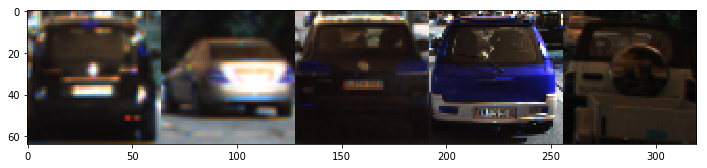

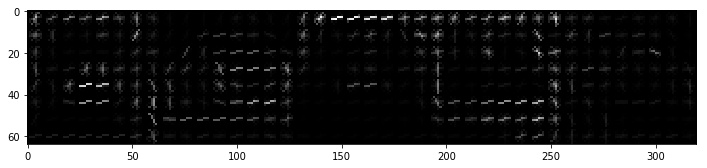

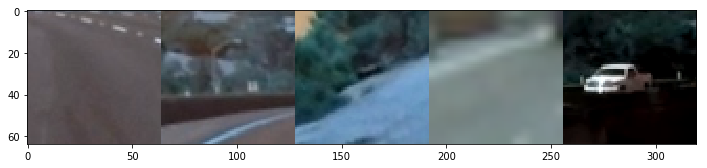

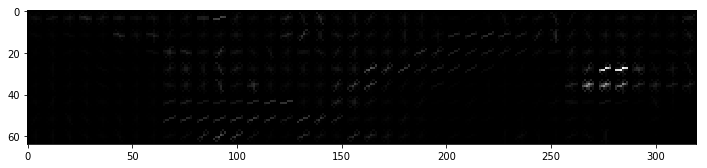

In [87]:
orient = 9
pix_per_cell = 8
cell_per_block = 2

c_image = random.sample(car_list, 5)
nc_image = random.sample(notcar_list, 5)
hog_cars = []
not_hog_cars = []
for c in c_image:
    n_image = cv2.imread(c)
    gray = cv2.cvtColor(n_image, cv2.COLOR_RGB2GRAY)
    # Call our function with vis=True to see an image output
    features, hog_image = get_hog_features(gray, orient, 
                        pix_per_cell, cell_per_block, 
                        vis=True, feature_vec=False)
    hog_cars.append(hog_image)

    
hog_cars_np = np.hstack(hog_cars)

# Plot the examples
fig = plt.figure()
fig.set_size_inches((12, 12))
#plt.subplot(121)
plt.imshow(np.hstack([cv2.imread(c) for c in c_image]))
fig = plt.figure()
fig.set_size_inches((12, 12))
#plt.subplot(121)
plt.imshow(hog_cars_np, cmap='gray')

for c in nc_image:
    n_image = cv2.imread(c)
    gray = cv2.cvtColor(n_image, cv2.COLOR_RGB2GRAY)
    # Call our function with vis=True to see an image output
    features, hog_image = get_hog_features(gray, orient, 
                        pix_per_cell, cell_per_block, 
                        vis=True, feature_vec=False)
    not_hog_cars.append(hog_image)

    
not_hog_cars_np = np.hstack(not_hog_cars)

# Plot the examples
fig = plt.figure()
fig.set_size_inches((12, 12))
#plt.subplot(121)
plt.imshow(np.hstack([cv2.imread(c) for c in nc_image]))
fig = plt.figure()
fig.set_size_inches((12, 12))
#plt.subplot(121)
plt.imshow(not_hog_cars_np, cmap='gray')


In [91]:
# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

In [92]:
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

# Define a function to draw bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

In [90]:
from sklearn.svm import LinearSVC
from sklearn.model_selection import train_test_split
import time
def classify_car(car_list, notcar_list):
    """
    Method to train the Linear SVM classifier.
    """
    color_space = 'RGB' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
    orient = 9  # HOG orientations
    pix_per_cell = 8 # HOG pixels per cell
    cell_per_block = 2 # HOG cells per block
    hog_channel = 0 # Can be 0, 1, 2, or "ALL"
    spatial_size = (32, 32) # Spatial binning dimensions
    hist_bins = 32    # Number of histogram bins
    spatial_feat = True # Spatial features on or off
    hist_feat = True # Histogram features on or off
    hog_feat = True # HOG features on or off
    y_start_stop = [400, 656] # Min and max in y to search in slide_window()


    car_features = extract_features(car_list, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
    notcar_features = extract_features(notcar_list, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)

    X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(X)
    # Apply the scaler to X
    scaled_X = X_scaler.transform(X)

    # Define the labels vector
    y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


    # Split up data into randomized training and test sets
    rand_state = np.random.randint(0, 100)
    X_train, X_test, y_train, y_test = train_test_split(
        scaled_X, y, test_size=0.2, random_state=rand_state)

    print('Using:',orient,'orientations',pix_per_cell,
        'pixels per cell and', cell_per_block,'cells per block')
    print('Feature vector length:', len(X_train[0]))
    # Use a linear SVC 
    svc = LinearSVC()
    # Check the training time for the SVC
    t=time.time()
    svc.fit(X_train, y_train)
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to train SVC...')
    # Check the score of the SVC
    print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
    """
    # Check the prediction time for a single sample
    t=time.time()

    image = mpimg.imread('../test_images/test1.jpg')
    draw_image = np.copy(image)

    # Uncomment the following line if you extracted training
    # data from .png images (scaled 0 to 1 by mpimg) and the
    # image you are searching is a .jpg (scaled 0 to 255)
    image = image.astype(np.float32)/255

    windows = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                        xy_window=(64, 64), xy_overlap=(0.25, 0.25))

    hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)                       

    window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    

    plt.imshow(window_img)
    """
    
    return svc, car_features, notcar_features, X_scaler

In [96]:
#### Testing for a single image
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)

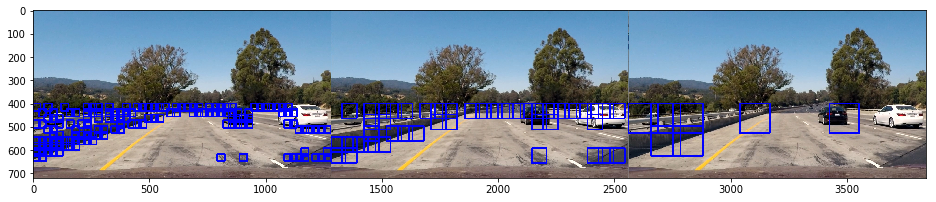

In [107]:
### Test the slide window and search windows through multiple iterations
import math
def test_multiple_sliding_windows(image):
    color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
    orient = 9  # HOG orientations
    pix_per_cell = 8 # HOG pixels per cell
    cell_per_block = 2 # HOG cells per block
    hog_channel = 0 # Can be 0, 1, 2, or "ALL"
    spatial_size = (32, 32) # Spatial binning dimensions
    hist_bins = 32    # Number of histogram bins
    spatial_feat = True # Spatial features on or off
    hist_feat = True # Histogram features on or off
    hog_feat = True # HOG features on or off
    y_start_stop = [400, 656]
    images = []
    for i in range(5,8):
        x_win = 2 ** i
        windows = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                        xy_window=(x_win, x_win), xy_overlap=(0.25, 0.25))

        hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)                       
        draw_image = np.copy(image)
        window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)
        images.append(window_img)
    return images

fig = plt.figure()
fig.set_size_inches((16, 16))
plt.imshow(np.hstack(test_multiple_sliding_windows(image)))

In [108]:
from sklearn.svm import LinearSVC

# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    boxes = []
    count = 0
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell)-1
    nyblocks = (ch1.shape[0] // pix_per_cell)-1 
    nfeat_per_block = orient*cell_per_block**2
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell)-1 
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            #print("Spacial features shape ::: {0}".format(spatial_features.shape))
            #print("Hist features shape ::: {0}".format(hist_features.shape))
            #print("Hog features shape ::: {0}".format(hog_features.shape))
            all_features = np.hstack((spatial_features, hist_features, hog_features))
            #print("All features shape ::: {0}".format(all_features.shape))
            # Scale features and make a prediction
            test_features = X_scaler.transform(all_features[:4932]).reshape(1,-1)
            test_features = test_features.reshape(1, -1)    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6)
                
                count+=1    
                if count>0:
                        boxes.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                
    return draw_img, boxes, count

In [14]:
orient = 9
pix_per_cell = 8
cell_per_block = 2
import random
d, car_list, notcar_list = prepare_data.data_look()
notcar_list = [ notcar_list[i] for i in sorted(random.sample(range(len(notcar_list)), len(car_list))) ]
print("Training set cars size ::::: {0}".format(len(car_list)))
print("Training set not cars size :::: {0}".format(len(notcar_list)))
svc, car_features, notcar_features, X_scaler = classify_car(car_list, notcar_list)

Training set cars size ::::: 5966
Training set not cars size :::: 5966


/usr/local/lib/python3.6/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


Using: 9 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 4932
33.43 Seconds to train SVC...
Test Accuracy of SVC =  0.9933


Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


/usr/local/lib/python3.6/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)
/usr/local/lib/python3.6/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
/usr/local/lib/python3.6/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
/usr/local/lib/python3.6/sit

/usr/local/lib/python3.6/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
/usr/local/lib/python3.6/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
/usr/local/lib/python3.6/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.re

/usr/local/lib/python3.6/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
/usr/local/lib/python3.6/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
/usr/local/lib/python3.6/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.re

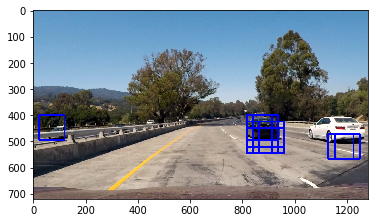

In [15]:
img = mpimg.imread('../test_images/test1.jpg')
#draw_img = np.copy(img)
#img = img.astype(np.float32)/255
scale = 1.5
ystart = 400
ystop = 656
img_tosearch = img[400:656,:,:]
print("Test Image Shape ::: {0}".format(img.shape))
print("Image to search shape :::: {0}".format(img_tosearch.shape))
img, boxes, count = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
plt.imshow(img)

In [16]:
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

In [17]:
def find_cars_multiple(img, ystart, ystop, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    #Bom scales = [1.1,1.4, 1.8, 2.2, 2.7, 3.2]
    scales = [1.1,1.4, 1.8, 2.4, 2.9, 3.4]
    
    c=0
    bbox = []           
    for scale in scales:
        c+=1
        #The first half of scales is valid for the upper half of image
        if c<len(scales):
            ystartaux = ystart
            ystopaux = int((ystart+ystop)/2)
        else:
            ystartaux = int((ystart+ystop)/2)
            ystopaux = ystop

        img, box, count = find_cars(img, ystartaux, ystopaux, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
        if count>0:
            for b in box:
                bbox.append(b)
    return bbox

In [18]:
img = mpimg.imread('../test_images/test1.jpg')
#draw_img = np.copy(img)
#img = img.astype(np.float32)/255
scale = 1.5
ystart = 400
ystop = 656
cspace = 'YCrCb'
img_tosearch = img[400:656,:,:]
print("Test Image Shape ::: {0}".format(img.shape))
print("Image to search shape :::: {0}".format(img_tosearch.shape))
bbox2 = find_cars_multiple(img, ystart, ystop, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)



Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


/usr/local/lib/python3.6/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)
/usr/local/lib/python3.6/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
/usr/local/lib/python3.6/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
/usr/local/lib/python3.6/sit

/usr/local/lib/python3.6/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
/usr/local/lib/python3.6/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
/usr/local/lib/python3.6/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.re

/usr/local/lib/python3.6/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
/usr/local/lib/python3.6/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
/usr/local/lib/python3.6/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.re

/usr/local/lib/python3.6/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
/usr/local/lib/python3.6/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
/usr/local/lib/python3.6/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.re

In [19]:
print(bbox2)

[((0, 435), (70, 505)), ((52, 400), (122, 470)), ((827, 417), (897, 487)), ((827, 435), (897, 505)), ((844, 417), (914, 487)), ((862, 417), (932, 487)), ((862, 435), (932, 505)), ((880, 417), (950, 487)), ((880, 435), (950, 505)), ((1073, 400), (1143, 470)), ((1091, 400), (1161, 470)), ((1144, 400), (1214, 470)), ((1161, 400), (1231, 470)), ((1179, 400), (1249, 470)), ((0, 400), (89, 489)), ((22, 400), (111, 489)), ((44, 400), (133, 489)), ((89, 400), (178, 489)), ((112, 400), (201, 489)), ((784, 400), (873, 489)), ((806, 400), (895, 489)), ((828, 400), (917, 489)), ((851, 400), (940, 489)), ((873, 400), (962, 489)), ((896, 400), (985, 489)), ((1052, 400), (1141, 489)), ((1075, 400), (1164, 489)), ((1097, 400), (1186, 489)), ((1120, 400), (1209, 489)), ((1142, 400), (1231, 489)), ((1164, 400), (1253, 489))]


In [52]:
from scipy.ndimage.measurements import label

def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(labels, heatmap, img=None):
    # Iterate through all detected cars
    b_heat=[] #((x1,y1),(x2,y2))

    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        highv = np.sum(heatmap[np.min(nonzeroy):np.max(nonzeroy), np.min(nonzerox):np.max(nonzerox)])
        
        
        # Draw the box on the image
        if not img is None:
            cv2.rectangle(img, bbox[0], bbox[1], (0,0,200), 3)
        
        b_heat.append(((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy))))

    # Return the image
    if not img is None:
        return img,b_heat
    else:
        return b_heat


In [21]:
# Add heat to each box in box list
def get_heat_map(img, bounding_box):
    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    heat = add_heat(heat,bbox2)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,1)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    print(labels[1])
    plt.imshow(labels[0], cmap='gray')
    draw_img, b_heat = draw_labeled_bboxes(np.copy(image), labels)
    plt.imshow(draw_img)
    fig = plt.figure()
    return draw_img

#plt.imshow(heatmap, cmap='hot')
#plt.title('Heat Map')

3


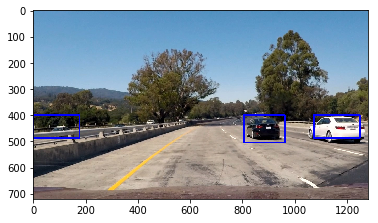

In [22]:

heat_image = mpimg.imread('../test_images/test1.jpg')
new_img = get_heat_map(heat_image, bbox2)

In [53]:
def get_heat_map(image,box_list,threshold=1, showImg = True):
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    # Add heat to each box in box list
    heat = add_heat(heat,box_list)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,threshold)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    
    
    if showImg ==  True:
        draw_img,lbl_heat = draw_labeled_bboxes( labels,heatmap,np.copy(image))
        return draw_img, heatmap,lbl_heat
    else:
        lbl_heat = draw_labeled_bboxes2(labels,heatmap)
        return heatmap,lbl_heat

[((0, 400), (177, 488)), ((806, 400), (961, 504)), ((1073, 400), (1248, 488))]
[((0, 400), (177, 488)), ((806, 400), (961, 504)), ((1073, 400), (1248, 488))]


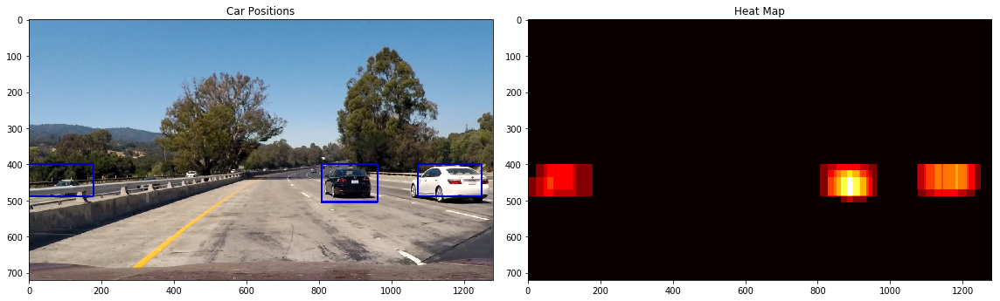

In [109]:

heat_image = mpimg.imread('../test_images/test6.jpg')
heata,lbl_ha = get_heat_map(heat_image,bbox2, 1, False)

print(lbl_ha)
dimg, heat,lbl_h = get_heat_map(image,bbox2, 1, True)
print(lbl_h)
fig = plt.figure()
fig.set_size_inches((16,16))
plt.subplot(121)
plt.imshow(dimg)
plt.title('Car Positions')
plt.subplot(122)
plt.imshow(heat, cmap='hot')
plt.title('Heat Map')
fig.tight_layout()

In [133]:
def process_image(img):
    global counter
    global bbox_frames
    
    counter+=1
    countFrame = counter % nframes
    
    #Find rectangles for one image
    #bbox1 = find_cars_multiple(img, ystart, ystop, svc, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, cspace, X_scaler)
    bbox_1 = find_cars_multiple(img, ystart, ystop, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    #Find heatmap single image
    thres = smooth_thres
    heat, bboxHeat = heatmap1(img,bbox1, thres, False)
   

    #Store the rectangles of the frame
    bbox_frames[countFrame] = bboxHeat
    
    #Sum rectangles of the nframes
    bbox2=[]
    for box in bbox_frames:
        if box!=0:
            for b in box:
                bbox2.append(b)
    
    #Find heatmap of average
    thres = smooth_average
    dimg, heat, bboxHeat2 = heatmap1(img, bbox2, thres, True)
    
    #print('bboxHeat2',bboxHeat2)
    
    
    #Merge heatmap with image by resizing the heat image into a smaller size
    sizeX = 300
    sizeY = 200
    heat2 = cv2.resize(heat, (sizeX,sizeY))
    
    res_img = cv2.resize(img, (sizeX,sizeY))
    res_img_gray = cv2.cvtColor(res_img , cv2.COLOR_RGB2GRAY)
    
    heat3=(heat2/np.max(heat2)*255).astype(int)   
    
    res_img_gray_R=res_img_gray #np.zeros_like(res_img_gray)
    res_img_gray_R[(heat2>0)] =255
    
    res_img_gray_G =res_img_gray
    res_img_gray_G[(heat2>0)] =0
    res_img_gray_B =res_img_gray
    res_img_gray_B[(heat2>0)] =0
     
    dimg[0:sizeY,0:sizeX,0]=res_img_gray_R +heat3
    dimg[0:sizeY,0:sizeX,1]=res_img_gray
    dimg[0:sizeY,0:sizeX,2]=res_img_gray
    
    
    cv2.putText(dimg,"Heat Map", (102,25), cv2.FONT_HERSHEY_SIMPLEX, .8,(255,255,255), 1,  lineType = cv2.LINE_AA)
    
    
    #Highest heat value
    #for elem in lbl_heat:
        #cv2.putText(dimg,str(highv), (102,40), cv2.FONT_HERSHEY_SIMPLEX, .6,(255,0,0), 1,  lineType = cv2.LINE_AA)

    #cv2.putText(dimg,str(counter), (108,70), cv2.FONT_HERSHEY_SIMPLEX, 1.1,(255,255,255), 1,  lineType = cv2.LINE_AA)

    return dimg

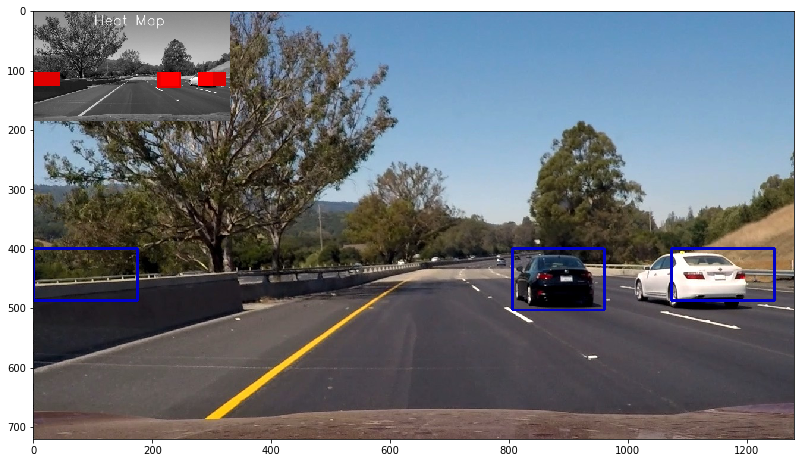

In [136]:
new_img = process_image(heat_image)
fig = plt.figure()
fig.set_size_inches((30,30))
plt.subplot(121)
plt.imshow(new_img)

In [ ]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import moviepy as mve

#Global values to be used in process image
counter=0
nframes = 25
smooth_thres = 1
smooth_average = 4

bbox_frames=[]
#Inicialization of list
for i in range(nframes):
    bbox_frames.append(0)
counter = 0


output = 'out_smooth_4.mp4'

clip1 = VideoFileClip("../project_video.mp4")

out_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time out_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video out_smooth_4.mp4
[MoviePy] Writing video out_smooth_4.mp4


100%|█████████▉| 1260/1261 [1:41:16<00:00,  1.13it/s]     


In [23]:
def process_image(img):
    scale = 1.5
    ystart = 400
    ystop = 656
    cspace = 'YCrCb'
    img_tosearch = img[400:656,:,:]
    print("Test Image Shape ::: {0}".format(img.shape))
    print("Image to search shape :::: {0}".format(img_tosearch.shape))
    bbox2 = find_cars_multiple(img, ystart, ystop, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    img = get_heat_map(img, bbox2)
    return img

In [34]:
def draw_labeled_bboxes2(labels, heatmap,img=None):
    # Iterate through all detected cars
    b_heat=[] #((x1,y1),(x2,y2))

    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        highv = np.sum(heatmap[np.min(nonzeroy):np.max(nonzeroy), np.min(nonzerox):np.max(nonzerox)])
        
        
        # Draw the box on the image
        if not img is None:
            cv2.rectangle(img, bbox[0], bbox[1], (0,0,200), 3)
        
        b_heat.append(((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy))))

    # Return the image
    if not img is None:
        return img,b_heat
    else:
        return b_heat


Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4
[MoviePy] >>>> Building video ../out_project_video.mp4
[MoviePy] Writing video ../out_project_video.mp4


  0%|          | 0/1261 [00:00<?, ?it/s]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  0%|          | 1/1261 [00:01<21:22,  1.02s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  0%|          | 2/1261 [00:02<22:52,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  0%|          | 3/1261 [00:03<23:31,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  0%|          | 4/1261 [00:04<24:05,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  0%|          | 5/1261 [00:05<23:08,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  0%|          | 6/1261 [00:06<23:50,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  1%|          | 7/1261 [00:08<28:11,  1.35s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  1%|          | 8/1261 [00:09<26:03,  1.25s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  1%|          | 9/1261 [00:10<25:14,  1.21s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  1%|          | 10/1261 [00:11<24:39,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  1%|          | 11/1261 [00:13<26:25,  1.27s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  1%|          | 12/1261 [00:14<26:36,  1.28s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  1%|          | 13/1261 [00:15<24:51,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  1%|          | 14/1261 [00:16<23:58,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  1%|          | 15/1261 [00:17<23:04,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  1%|▏         | 16/1261 [00:19<25:03,  1.21s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  1%|▏         | 17/1261 [00:20<24:35,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  1%|▏         | 18/1261 [00:21<23:16,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  2%|▏         | 19/1261 [00:22<22:25,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  2%|▏         | 20/1261 [00:23<23:19,  1.13s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  2%|▏         | 21/1261 [00:24<24:13,  1.17s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  2%|▏         | 22/1261 [00:26<24:39,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  2%|▏         | 23/1261 [00:27<23:20,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  2%|▏         | 24/1261 [00:28<22:19,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  2%|▏         | 25/1261 [00:29<24:59,  1.21s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  2%|▏         | 26/1261 [00:30<23:48,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  2%|▏         | 27/1261 [00:31<23:25,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  2%|▏         | 28/1261 [00:32<22:56,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  2%|▏         | 29/1261 [00:33<22:28,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  2%|▏         | 30/1261 [00:34<21:54,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  2%|▏         | 31/1261 [00:36<24:02,  1.17s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  3%|▎         | 32/1261 [00:37<23:23,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  3%|▎         | 33/1261 [00:38<22:56,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  3%|▎         | 34/1261 [00:40<26:02,  1.27s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  3%|▎         | 35/1261 [00:41<25:04,  1.23s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  3%|▎         | 36/1261 [00:42<23:59,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  3%|▎         | 37/1261 [00:43<25:11,  1.24s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  3%|▎         | 38/1261 [00:46<34:35,  1.70s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  3%|▎         | 39/1261 [00:47<32:47,  1.61s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  3%|▎         | 40/1261 [00:48<29:48,  1.46s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  3%|▎         | 41/1261 [00:50<30:28,  1.50s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  3%|▎         | 42/1261 [00:51<27:34,  1.36s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  3%|▎         | 43/1261 [00:53<29:59,  1.48s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  3%|▎         | 44/1261 [00:54<30:12,  1.49s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  4%|▎         | 45/1261 [00:56<29:12,  1.44s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  4%|▎         | 46/1261 [00:57<28:08,  1.39s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  4%|▎         | 47/1261 [00:58<26:52,  1.33s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  4%|▍         | 48/1261 [01:00<29:45,  1.47s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  4%|▍         | 49/1261 [01:03<37:04,  1.84s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  4%|▍         | 50/1261 [01:04<36:53,  1.83s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  4%|▍         | 51/1261 [01:07<39:41,  1.97s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  4%|▍         | 52/1261 [01:09<42:04,  2.09s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  4%|▍         | 53/1261 [01:14<58:25,  2.90s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  4%|▍         | 54/1261 [01:17<59:09,  2.94s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  4%|▍         | 55/1261 [01:19<55:26,  2.76s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  4%|▍         | 56/1261 [01:23<1:01:11,  3.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  5%|▍         | 57/1261 [01:24<50:02,  2.49s/it]  

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  5%|▍         | 58/1261 [01:26<45:02,  2.25s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  5%|▍         | 59/1261 [01:27<37:46,  1.89s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  5%|▍         | 60/1261 [01:28<33:32,  1.68s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  5%|▍         | 61/1261 [01:29<31:16,  1.56s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  5%|▍         | 62/1261 [01:30<28:03,  1.40s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  5%|▍         | 63/1261 [01:33<33:01,  1.65s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  5%|▌         | 64/1261 [01:34<29:10,  1.46s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  5%|▌         | 65/1261 [01:35<26:33,  1.33s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  5%|▌         | 66/1261 [01:36<26:30,  1.33s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  5%|▌         | 67/1261 [01:38<27:59,  1.41s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  5%|▌         | 68/1261 [01:39<26:42,  1.34s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  5%|▌         | 69/1261 [01:40<27:41,  1.39s/it]

4
Test Image Shape ::: (720, 1280, 3)

  6%|▌         | 70/1261 [01:41<26:54,  1.36s/it]


Image to search shape :::: (256, 1280, 3)
4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  6%|▌         | 71/1261 [01:44<32:53,  1.66s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  6%|▌         | 72/1261 [01:45<29:04,  1.47s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  6%|▌         | 73/1261 [01:46<26:18,  1.33s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  6%|▌         | 74/1261 [01:47<24:19,  1.23s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  6%|▌         | 75/1261 [01:48<23:45,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  6%|▌         | 76/1261 [01:49<22:51,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  6%|▌         | 77/1261 [01:50<22:10,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  6%|▌         | 78/1261 [01:53<30:51,  1.56s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  6%|▋         | 79/1261 [01:55<35:30,  1.80s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  6%|▋         | 80/1261 [01:57<34:24,  1.75s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  6%|▋         | 81/1261 [01:58<33:06,  1.68s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  7%|▋         | 82/1261 [01:59<30:39,  1.56s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  7%|▋         | 83/1261 [02:01<28:21,  1.44s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  7%|▋         | 84/1261 [02:02<25:54,  1.32s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  7%|▋         | 85/1261 [02:03<28:35,  1.46s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  7%|▋         | 86/1261 [02:05<30:05,  1.54s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  7%|▋         | 87/1261 [02:06<27:09,  1.39s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  7%|▋         | 88/1261 [02:07<25:09,  1.29s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  7%|▋         | 89/1261 [02:08<24:15,  1.24s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  7%|▋         | 90/1261 [02:09<23:00,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  7%|▋         | 91/1261 [02:11<22:13,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  7%|▋         | 92/1261 [02:12<22:28,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  7%|▋         | 93/1261 [02:13<23:06,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  7%|▋         | 94/1261 [02:15<28:25,  1.46s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  8%|▊         | 95/1261 [02:17<29:08,  1.50s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  8%|▊         | 96/1261 [02:20<41:25,  2.13s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  8%|▊         | 97/1261 [02:22<40:02,  2.06s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  8%|▊         | 98/1261 [02:23<34:38,  1.79s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  8%|▊         | 99/1261 [02:24<30:56,  1.60s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  8%|▊         | 100/1261 [02:26<30:20,  1.57s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  8%|▊         | 101/1261 [02:27<27:21,  1.41s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  8%|▊         | 102/1261 [02:28<25:33,  1.32s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  8%|▊         | 103/1261 [02:29<23:54,  1.24s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  8%|▊         | 104/1261 [02:30<22:25,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  8%|▊         | 105/1261 [02:31<21:23,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  8%|▊         | 106/1261 [02:32<21:25,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  8%|▊         | 107/1261 [02:33<20:48,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  9%|▊         | 108/1261 [02:34<20:16,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


  9%|▊         | 109/1261 [02:36<22:40,  1.18s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  9%|▊         | 110/1261 [02:37<23:42,  1.24s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  9%|▉         | 111/1261 [02:38<22:04,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  9%|▉         | 112/1261 [02:39<21:01,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  9%|▉         | 113/1261 [02:40<20:50,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  9%|▉         | 114/1261 [02:41<20:05,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  9%|▉         | 115/1261 [02:42<19:34,  1.02s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  9%|▉         | 116/1261 [02:43<19:16,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  9%|▉         | 117/1261 [02:44<20:51,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  9%|▉         | 118/1261 [02:45<19:59,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


  9%|▉         | 119/1261 [02:47<21:41,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 10%|▉         | 120/1261 [02:48<21:54,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 10%|▉         | 121/1261 [02:49<20:59,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 10%|▉         | 122/1261 [02:50<20:34,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 10%|▉         | 123/1261 [02:51<21:49,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 10%|▉         | 124/1261 [02:52<22:10,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 10%|▉         | 125/1261 [02:54<22:26,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 10%|▉         | 126/1261 [02:55<24:32,  1.30s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 10%|█         | 127/1261 [02:56<23:44,  1.26s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 10%|█         | 128/1261 [02:59<30:27,  1.61s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 10%|█         | 129/1261 [03:00<27:56,  1.48s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 10%|█         | 130/1261 [03:01<25:04,  1.33s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 10%|█         | 131/1261 [03:02<23:46,  1.26s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 10%|█         | 132/1261 [03:03<22:29,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 11%|█         | 133/1261 [03:04<22:23,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 11%|█         | 134/1261 [03:06<24:04,  1.28s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 11%|█         | 135/1261 [03:07<23:41,  1.26s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 11%|█         | 136/1261 [03:09<29:17,  1.56s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 11%|█         | 137/1261 [03:10<26:13,  1.40s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 11%|█         | 138/1261 [03:11<23:45,  1.27s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 11%|█         | 139/1261 [03:12<22:23,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 11%|█         | 140/1261 [03:13<21:06,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 11%|█         | 141/1261 [03:14<20:23,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 11%|█▏        | 142/1261 [03:15<21:22,  1.15s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 11%|█▏        | 143/1261 [03:16<20:56,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 11%|█▏        | 144/1261 [03:18<22:11,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 11%|█▏        | 145/1261 [03:20<25:22,  1.36s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 12%|█▏        | 146/1261 [03:21<23:41,  1.27s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 12%|█▏        | 147/1261 [03:22<22:18,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 12%|█▏        | 148/1261 [03:23<21:30,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 12%|█▏        | 149/1261 [03:24<23:08,  1.25s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 12%|█▏        | 150/1261 [03:25<21:43,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 12%|█▏        | 151/1261 [03:26<20:53,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 12%|█▏        | 152/1261 [03:27<20:03,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 12%|█▏        | 153/1261 [03:28<19:26,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 12%|█▏        | 154/1261 [03:30<21:55,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 12%|█▏        | 155/1261 [03:31<20:48,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 12%|█▏        | 156/1261 [03:32<20:00,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 12%|█▏        | 157/1261 [03:33<19:19,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 13%|█▎        | 158/1261 [03:34<19:13,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 13%|█▎        | 159/1261 [03:35<18:54,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 13%|█▎        | 160/1261 [03:36<19:21,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 13%|█▎        | 161/1261 [03:37<19:12,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 13%|█▎        | 162/1261 [03:38<21:15,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 13%|█▎        | 163/1261 [03:40<25:45,  1.41s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 13%|█▎        | 164/1261 [03:41<24:47,  1.36s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 13%|█▎        | 165/1261 [03:43<23:42,  1.30s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 13%|█▎        | 166/1261 [03:44<22:17,  1.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 13%|█▎        | 167/1261 [03:46<25:48,  1.42s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 13%|█▎        | 168/1261 [03:47<24:07,  1.32s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 13%|█▎        | 169/1261 [03:48<24:25,  1.34s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 13%|█▎        | 170/1261 [03:50<25:10,  1.38s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 14%|█▎        | 171/1261 [03:51<26:13,  1.44s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 14%|█▎        | 172/1261 [03:52<23:41,  1.31s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 14%|█▎        | 173/1261 [03:53<21:52,  1.21s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 14%|█▍        | 174/1261 [03:54<20:51,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 14%|█▍        | 175/1261 [03:55<19:59,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 14%|█▍        | 176/1261 [03:56<19:39,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 14%|█▍        | 177/1261 [03:58<23:39,  1.31s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 14%|█▍        | 178/1261 [04:00<25:33,  1.42s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 14%|█▍        | 179/1261 [04:01<26:18,  1.46s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 14%|█▍        | 180/1261 [04:02<24:39,  1.37s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 14%|█▍        | 181/1261 [04:03<22:44,  1.26s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 14%|█▍        | 182/1261 [04:05<22:10,  1.23s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 15%|█▍        | 183/1261 [04:06<21:33,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 15%|█▍        | 184/1261 [04:07<22:04,  1.23s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 15%|█▍        | 185/1261 [04:09<23:58,  1.34s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 15%|█▍        | 186/1261 [04:10<24:16,  1.35s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 15%|█▍        | 187/1261 [04:11<22:56,  1.28s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 15%|█▍        | 188/1261 [04:13<24:15,  1.36s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 15%|█▍        | 189/1261 [04:14<22:56,  1.28s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 15%|█▌        | 190/1261 [04:15<21:25,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 15%|█▌        | 191/1261 [04:16<20:50,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 15%|█▌        | 192/1261 [04:17<21:39,  1.22s/it]

4


 15%|█▌        | 193/1261 [04:18<20:59,  1.18s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 15%|█▌        | 194/1261 [04:19<20:17,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 15%|█▌        | 195/1261 [04:20<19:46,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 16%|█▌        | 196/1261 [04:21<19:56,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 16%|█▌        | 197/1261 [04:23<22:43,  1.28s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 16%|█▌        | 198/1261 [04:24<21:28,  1.21s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 16%|█▌        | 199/1261 [04:25<20:20,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 16%|█▌        | 200/1261 [04:26<19:28,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 16%|█▌        | 201/1261 [04:27<19:13,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 16%|█▌        | 202/1261 [04:28<20:17,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 16%|█▌        | 203/1261 [04:30<21:44,  1.23s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 16%|█▌        | 204/1261 [04:31<21:03,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 16%|█▋        | 205/1261 [04:33<23:20,  1.33s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 16%|█▋        | 206/1261 [04:34<24:13,  1.38s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 16%|█▋        | 207/1261 [04:35<22:51,  1.30s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 16%|█▋        | 208/1261 [04:36<21:59,  1.25s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 17%|█▋        | 209/1261 [04:38<21:47,  1.24s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 17%|█▋        | 210/1261 [04:39<20:20,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 17%|█▋        | 211/1261 [04:40<19:51,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)

 17%|█▋        | 212/1261 [04:41<19:22,  1.11s/it]


Image to search shape :::: (256, 1280, 3)
4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 17%|█▋        | 213/1261 [04:42<20:12,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 17%|█▋        | 214/1261 [04:43<19:54,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 17%|█▋        | 215/1261 [04:46<28:25,  1.63s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 17%|█▋        | 216/1261 [04:47<24:54,  1.43s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 17%|█▋        | 217/1261 [04:48<23:17,  1.34s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 17%|█▋        | 218/1261 [04:49<21:58,  1.26s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 17%|█▋        | 219/1261 [04:50<22:54,  1.32s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 17%|█▋        | 220/1261 [04:52<23:13,  1.34s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 18%|█▊        | 221/1261 [04:53<21:24,  1.24s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 18%|█▊        | 222/1261 [04:55<24:00,  1.39s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 18%|█▊        | 223/1261 [04:56<24:02,  1.39s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 18%|█▊        | 224/1261 [04:57<22:07,  1.28s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 18%|█▊        | 225/1261 [04:58<20:36,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 18%|█▊        | 226/1261 [04:59<20:25,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 18%|█▊        | 227/1261 [05:00<20:04,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 18%|█▊        | 228/1261 [05:02<20:42,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 18%|█▊        | 229/1261 [05:03<19:44,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 18%|█▊        | 230/1261 [05:04<19:59,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 18%|█▊        | 231/1261 [05:05<21:43,  1.27s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 18%|█▊        | 232/1261 [05:07<22:10,  1.29s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 18%|█▊        | 233/1261 [05:08<20:48,  1.21s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 19%|█▊        | 234/1261 [05:09<19:45,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 19%|█▊        | 235/1261 [05:10<19:07,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 19%|█▊        | 236/1261 [05:11<18:30,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 19%|█▉        | 237/1261 [05:12<20:18,  1.19s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 19%|█▉        | 238/1261 [05:14<21:02,  1.23s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 19%|█▉        | 239/1261 [05:15<21:02,  1.24s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 19%|█▉        | 240/1261 [05:17<26:25,  1.55s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 19%|█▉        | 241/1261 [05:18<23:47,  1.40s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 19%|█▉        | 242/1261 [05:19<21:37,  1.27s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 19%|█▉        | 243/1261 [05:20<20:02,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 19%|█▉        | 244/1261 [05:21<19:38,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 19%|█▉        | 245/1261 [05:22<19:00,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 20%|█▉        | 246/1261 [05:23<18:10,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 20%|█▉        | 247/1261 [05:24<17:49,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 20%|█▉        | 248/1261 [05:25<18:16,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 20%|█▉        | 249/1261 [05:27<19:47,  1.17s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 20%|█▉        | 250/1261 [05:28<21:00,  1.25s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 20%|█▉        | 251/1261 [05:29<20:18,  1.21s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 20%|█▉        | 252/1261 [05:30<19:11,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 20%|██        | 253/1261 [05:31<18:12,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 20%|██        | 254/1261 [05:32<17:42,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 20%|██        | 255/1261 [05:33<17:14,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 20%|██        | 256/1261 [05:34<16:57,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 20%|██        | 257/1261 [05:35<16:54,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 20%|██        | 258/1261 [05:36<16:44,  1.00s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 21%|██        | 259/1261 [05:37<18:27,  1.11s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 21%|██        | 260/1261 [05:38<18:12,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 21%|██        | 261/1261 [05:39<17:41,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 21%|██        | 262/1261 [05:40<17:19,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 21%|██        | 263/1261 [05:41<16:54,  1.02s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 21%|██        | 264/1261 [05:42<16:39,  1.00s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 21%|██        | 265/1261 [05:43<16:25,  1.01it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 21%|██        | 266/1261 [05:44<16:25,  1.01it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 21%|██        | 267/1261 [05:45<16:33,  1.00it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 21%|██▏       | 268/1261 [05:46<16:35,  1.00s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 21%|██▏       | 269/1261 [05:48<17:20,  1.05s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 21%|██▏       | 270/1261 [05:49<18:02,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 21%|██▏       | 271/1261 [05:50<17:28,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 22%|██▏       | 272/1261 [05:51<17:16,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 22%|██▏       | 273/1261 [05:52<17:04,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 22%|██▏       | 274/1261 [05:53<16:59,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 22%|██▏       | 275/1261 [05:55<21:49,  1.33s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 22%|██▏       | 276/1261 [05:56<19:59,  1.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 22%|██▏       | 277/1261 [05:57<18:44,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 22%|██▏       | 278/1261 [05:58<20:25,  1.25s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 22%|██▏       | 279/1261 [05:59<19:49,  1.21s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 22%|██▏       | 280/1261 [06:00<18:48,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 22%|██▏       | 281/1261 [06:02<20:29,  1.26s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 22%|██▏       | 282/1261 [06:03<19:19,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 22%|██▏       | 283/1261 [06:04<18:51,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 23%|██▎       | 284/1261 [06:05<18:41,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 23%|██▎       | 285/1261 [06:06<18:43,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 23%|██▎       | 286/1261 [06:07<17:37,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 23%|██▎       | 287/1261 [06:08<17:59,  1.11s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 23%|██▎       | 288/1261 [06:10<19:52,  1.23s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 23%|██▎       | 289/1261 [06:11<18:45,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 23%|██▎       | 290/1261 [06:12<18:39,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 23%|██▎       | 291/1261 [06:13<18:37,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 23%|██▎       | 292/1261 [06:14<18:07,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 23%|██▎       | 293/1261 [06:15<17:29,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 23%|██▎       | 294/1261 [06:16<17:24,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 23%|██▎       | 295/1261 [06:17<17:08,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 23%|██▎       | 296/1261 [06:18<17:23,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 24%|██▎       | 297/1261 [06:20<19:56,  1.24s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 24%|██▎       | 298/1261 [06:21<18:54,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 24%|██▎       | 299/1261 [06:22<17:58,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 24%|██▍       | 300/1261 [06:23<17:18,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 24%|██▍       | 301/1261 [06:24<16:50,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 24%|██▍       | 302/1261 [06:25<16:39,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 24%|██▍       | 303/1261 [06:26<16:53,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 24%|██▍       | 304/1261 [06:27<16:50,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 24%|██▍       | 305/1261 [06:28<16:35,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 24%|██▍       | 306/1261 [06:29<16:29,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 24%|██▍       | 307/1261 [06:31<19:34,  1.23s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 24%|██▍       | 308/1261 [06:32<18:59,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 25%|██▍       | 309/1261 [06:33<18:06,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 25%|██▍       | 310/1261 [06:34<17:24,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 25%|██▍       | 311/1261 [06:36<23:48,  1.50s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 25%|██▍       | 312/1261 [06:38<24:23,  1.54s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 25%|██▍       | 313/1261 [06:39<22:31,  1.43s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 25%|██▍       | 314/1261 [06:41<25:52,  1.64s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 25%|██▍       | 315/1261 [06:43<26:11,  1.66s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 25%|██▌       | 316/1261 [06:44<24:24,  1.55s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 25%|██▌       | 317/1261 [06:46<22:24,  1.42s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 25%|██▌       | 318/1261 [06:47<21:19,  1.36s/it]

4
Test Image Shape ::: (720, 1280, 3)

 25%|██▌       | 319/1261 [06:48<22:19,  1.42s/it]


Image to search shape :::: (256, 1280, 3)
4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 25%|██▌       | 320/1261 [06:52<31:53,  2.03s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 25%|██▌       | 321/1261 [06:55<36:18,  2.32s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 26%|██▌       | 322/1261 [06:58<38:41,  2.47s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 26%|██▌       | 323/1261 [06:59<34:32,  2.21s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 26%|██▌       | 324/1261 [07:01<34:29,  2.21s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 26%|██▌       | 325/1261 [07:03<30:03,  1.93s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 26%|██▌       | 326/1261 [07:05<29:58,  1.92s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 26%|██▌       | 327/1261 [07:06<28:56,  1.86s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 26%|██▌       | 328/1261 [07:07<25:04,  1.61s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 26%|██▌       | 329/1261 [07:08<22:07,  1.42s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 26%|██▌       | 330/1261 [07:09<19:48,  1.28s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 26%|██▌       | 331/1261 [07:10<18:19,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 26%|██▋       | 332/1261 [07:11<18:37,  1.20s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 26%|██▋       | 333/1261 [07:13<20:08,  1.30s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 26%|██▋       | 334/1261 [07:14<18:49,  1.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 27%|██▋       | 335/1261 [07:15<17:58,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 27%|██▋       | 336/1261 [07:16<17:26,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 27%|██▋       | 337/1261 [07:17<18:15,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)

 27%|██▋       | 338/1261 [07:19<17:55,  1.17s/it]


Image to search shape :::: (256, 1280, 3)
4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 27%|██▋       | 339/1261 [07:20<17:23,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 27%|██▋       | 340/1261 [07:21<17:47,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 27%|██▋       | 341/1261 [07:22<19:53,  1.30s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 27%|██▋       | 342/1261 [07:24<20:45,  1.36s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 27%|██▋       | 343/1261 [07:25<19:50,  1.30s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 27%|██▋       | 344/1261 [07:26<19:20,  1.27s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 27%|██▋       | 345/1261 [07:27<18:53,  1.24s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 27%|██▋       | 346/1261 [07:29<19:19,  1.27s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 28%|██▊       | 347/1261 [07:30<18:16,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 28%|██▊       | 348/1261 [07:31<17:11,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 28%|██▊       | 349/1261 [07:32<16:57,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 28%|██▊       | 350/1261 [07:34<19:37,  1.29s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 28%|██▊       | 351/1261 [07:39<36:18,  2.39s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 28%|██▊       | 352/1261 [07:40<31:38,  2.09s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 28%|██▊       | 353/1261 [07:41<27:21,  1.81s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 28%|██▊       | 354/1261 [07:43<26:04,  1.73s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 28%|██▊       | 355/1261 [07:45<27:13,  1.80s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 28%|██▊       | 356/1261 [07:46<23:50,  1.58s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 28%|██▊       | 357/1261 [07:47<21:09,  1.40s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 28%|██▊       | 358/1261 [07:48<19:04,  1.27s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 28%|██▊       | 359/1261 [07:49<17:36,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 29%|██▊       | 360/1261 [07:50<17:43,  1.18s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 29%|██▊       | 361/1261 [07:51<17:12,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 29%|██▊       | 362/1261 [07:52<17:23,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 29%|██▉       | 363/1261 [07:53<18:08,  1.21s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 29%|██▉       | 364/1261 [07:55<20:44,  1.39s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 29%|██▉       | 365/1261 [07:56<19:34,  1.31s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 29%|██▉       | 366/1261 [07:57<17:59,  1.21s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 29%|██▉       | 367/1261 [07:58<16:53,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 29%|██▉       | 368/1261 [07:59<16:06,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 29%|██▉       | 369/1261 [08:00<15:45,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 29%|██▉       | 370/1261 [08:01<15:16,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 29%|██▉       | 371/1261 [08:02<15:26,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 30%|██▉       | 372/1261 [08:04<17:17,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 30%|██▉       | 373/1261 [08:05<17:44,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 30%|██▉       | 374/1261 [08:06<19:30,  1.32s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 30%|██▉       | 375/1261 [08:08<18:08,  1.23s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 30%|██▉       | 376/1261 [08:09<18:00,  1.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 30%|██▉       | 377/1261 [08:10<17:29,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 30%|██▉       | 378/1261 [08:11<18:31,  1.26s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 30%|███       | 379/1261 [08:12<17:58,  1.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 30%|███       | 380/1261 [08:14<18:05,  1.23s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 30%|███       | 381/1261 [08:15<17:49,  1.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 30%|███       | 382/1261 [08:16<18:09,  1.24s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 30%|███       | 383/1261 [08:17<18:38,  1.27s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 30%|███       | 384/1261 [08:18<17:25,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 31%|███       | 385/1261 [08:19<16:27,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 31%|███       | 386/1261 [08:20<15:50,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 31%|███       | 387/1261 [08:21<15:17,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 31%|███       | 388/1261 [08:23<15:36,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 31%|███       | 389/1261 [08:24<15:44,  1.08s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 31%|███       | 390/1261 [08:25<16:46,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 31%|███       | 391/1261 [08:26<15:57,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 31%|███       | 392/1261 [08:27<16:19,  1.13s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 31%|███       | 393/1261 [08:28<16:05,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 31%|███       | 394/1261 [08:29<15:18,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 31%|███▏      | 395/1261 [08:30<14:53,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 31%|███▏      | 396/1261 [08:31<14:30,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 31%|███▏      | 397/1261 [08:32<14:25,  1.00s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 32%|███▏      | 398/1261 [08:33<14:21,  1.00it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 32%|███▏      | 399/1261 [08:34<14:32,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 32%|███▏      | 400/1261 [08:35<14:19,  1.00it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 32%|███▏      | 401/1261 [08:36<14:03,  1.02it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 32%|███▏      | 402/1261 [08:37<13:53,  1.03it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 32%|███▏      | 403/1261 [08:38<15:17,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 32%|███▏      | 404/1261 [08:39<14:44,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 32%|███▏      | 405/1261 [08:40<14:20,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 32%|███▏      | 406/1261 [08:41<14:15,  1.00s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 32%|███▏      | 407/1261 [08:42<14:14,  1.00s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 32%|███▏      | 408/1261 [08:43<14:02,  1.01it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 32%|███▏      | 409/1261 [08:44<13:55,  1.02it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 33%|███▎      | 410/1261 [08:45<14:01,  1.01it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 33%|███▎      | 411/1261 [08:46<13:47,  1.03it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 33%|███▎      | 412/1261 [08:47<13:49,  1.02it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 33%|███▎      | 413/1261 [08:48<15:23,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 33%|███▎      | 414/1261 [08:49<15:00,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 33%|███▎      | 415/1261 [08:50<14:30,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 33%|███▎      | 416/1261 [08:51<14:08,  1.00s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 33%|███▎      | 417/1261 [08:52<13:46,  1.02it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 33%|███▎      | 418/1261 [08:53<13:30,  1.04it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 33%|███▎      | 419/1261 [08:54<13:33,  1.03it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 33%|███▎      | 420/1261 [08:55<13:29,  1.04it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 33%|███▎      | 421/1261 [08:56<13:36,  1.03it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 33%|███▎      | 422/1261 [08:58<16:29,  1.18s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 34%|███▎      | 423/1261 [09:00<20:47,  1.49s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 34%|███▎      | 424/1261 [09:01<19:43,  1.41s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 34%|███▎      | 425/1261 [09:02<19:09,  1.38s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 34%|███▍      | 426/1261 [09:04<20:13,  1.45s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 34%|███▍      | 427/1261 [09:05<18:41,  1.34s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 34%|███▍      | 428/1261 [09:06<17:59,  1.30s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 34%|███▍      | 429/1261 [09:07<16:41,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 34%|███▍      | 430/1261 [09:09<18:11,  1.31s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 34%|███▍      | 431/1261 [09:10<17:02,  1.23s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 34%|███▍      | 432/1261 [09:11<16:06,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 34%|███▍      | 433/1261 [09:12<15:13,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 34%|███▍      | 434/1261 [09:13<14:54,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 34%|███▍      | 435/1261 [09:14<14:36,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 35%|███▍      | 436/1261 [09:15<14:19,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 35%|███▍      | 437/1261 [09:16<14:03,  1.02s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 35%|███▍      | 438/1261 [09:17<13:39,  1.00it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 35%|███▍      | 439/1261 [09:18<13:32,  1.01it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 35%|███▍      | 440/1261 [09:20<18:36,  1.36s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 35%|███▍      | 441/1261 [09:21<19:08,  1.40s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 35%|███▌      | 442/1261 [09:23<18:06,  1.33s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 35%|███▌      | 443/1261 [09:24<17:07,  1.26s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 35%|███▌      | 444/1261 [09:27<24:50,  1.82s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 35%|███▌      | 445/1261 [09:29<26:10,  1.92s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 35%|███▌      | 446/1261 [09:32<28:39,  2.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 35%|███▌      | 447/1261 [09:33<25:50,  1.90s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 36%|███▌      | 448/1261 [09:34<23:07,  1.71s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 36%|███▌      | 449/1261 [09:35<21:09,  1.56s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 36%|███▌      | 450/1261 [09:37<19:46,  1.46s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 36%|███▌      | 451/1261 [09:38<18:53,  1.40s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 36%|███▌      | 452/1261 [09:39<18:33,  1.38s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 36%|███▌      | 453/1261 [09:41<20:33,  1.53s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 36%|███▌      | 454/1261 [09:42<18:45,  1.39s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 36%|███▌      | 455/1261 [09:44<18:24,  1.37s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 36%|███▌      | 456/1261 [09:45<17:24,  1.30s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 36%|███▌      | 457/1261 [09:46<16:37,  1.24s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 36%|███▋      | 458/1261 [09:47<15:50,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 36%|███▋      | 459/1261 [09:48<16:17,  1.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 36%|███▋      | 460/1261 [09:49<16:35,  1.24s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 37%|███▋      | 461/1261 [09:51<16:10,  1.21s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 37%|███▋      | 462/1261 [09:52<16:43,  1.26s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 37%|███▋      | 463/1261 [09:53<15:34,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 37%|███▋      | 464/1261 [09:54<14:56,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 37%|███▋      | 465/1261 [09:55<15:12,  1.15s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 37%|███▋      | 466/1261 [09:56<15:59,  1.21s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 37%|███▋      | 467/1261 [09:58<15:28,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 37%|███▋      | 468/1261 [09:59<14:57,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 37%|███▋      | 469/1261 [10:00<14:18,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 37%|███▋      | 470/1261 [10:01<13:51,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 37%|███▋      | 471/1261 [10:02<15:25,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 37%|███▋      | 472/1261 [10:03<14:54,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 38%|███▊      | 473/1261 [10:04<14:19,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 38%|███▊      | 474/1261 [10:05<13:54,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 38%|███▊      | 475/1261 [10:06<14:13,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 38%|███▊      | 476/1261 [10:07<13:55,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 38%|███▊      | 477/1261 [10:08<13:41,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 38%|███▊      | 478/1261 [10:09<13:21,  1.02s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 38%|███▊      | 479/1261 [10:10<12:59,  1.00it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 38%|███▊      | 480/1261 [10:11<12:48,  1.02it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 38%|███▊      | 481/1261 [10:13<15:31,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 38%|███▊      | 482/1261 [10:14<15:32,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 38%|███▊      | 483/1261 [10:15<14:53,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 38%|███▊      | 484/1261 [10:16<14:26,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 38%|███▊      | 485/1261 [10:17<14:47,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 39%|███▊      | 486/1261 [10:18<14:42,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 39%|███▊      | 487/1261 [10:19<14:10,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 39%|███▊      | 488/1261 [10:20<13:34,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 39%|███▉      | 489/1261 [10:21<13:41,  1.06s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 39%|███▉      | 490/1261 [10:23<16:10,  1.26s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 39%|███▉      | 491/1261 [10:24<15:24,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 39%|███▉      | 492/1261 [10:25<14:53,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 39%|███▉      | 493/1261 [10:26<14:45,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 39%|███▉      | 494/1261 [10:27<14:30,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 39%|███▉      | 495/1261 [10:29<14:18,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 39%|███▉      | 496/1261 [10:30<14:01,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 39%|███▉      | 497/1261 [10:31<13:54,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 39%|███▉      | 498/1261 [10:32<14:02,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 40%|███▉      | 499/1261 [10:33<16:02,  1.26s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 40%|███▉      | 500/1261 [10:35<15:28,  1.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 40%|███▉      | 501/1261 [10:36<14:38,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 40%|███▉      | 502/1261 [10:37<13:49,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 40%|███▉      | 503/1261 [10:38<13:24,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 40%|███▉      | 504/1261 [10:39<13:14,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 40%|████      | 505/1261 [10:40<13:19,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 40%|████      | 506/1261 [10:41<13:02,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 40%|████      | 507/1261 [10:42<12:58,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 40%|████      | 508/1261 [10:43<12:41,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 40%|████      | 509/1261 [10:44<14:41,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 40%|████      | 510/1261 [10:45<14:09,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 41%|████      | 511/1261 [10:46<13:49,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 41%|████      | 512/1261 [10:47<13:25,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 41%|████      | 513/1261 [10:48<13:19,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 41%|████      | 514/1261 [10:49<13:26,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 41%|████      | 515/1261 [10:50<13:14,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 41%|████      | 516/1261 [10:51<13:06,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 41%|████      | 517/1261 [10:52<12:58,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 41%|████      | 518/1261 [10:54<13:16,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 41%|████      | 519/1261 [10:56<18:03,  1.46s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 41%|████      | 520/1261 [10:57<17:12,  1.39s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 41%|████▏     | 521/1261 [10:58<16:44,  1.36s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 41%|████▏     | 522/1261 [11:00<16:50,  1.37s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 41%|████▏     | 523/1261 [11:02<19:02,  1.55s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 42%|████▏     | 524/1261 [11:03<18:13,  1.48s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 42%|████▏     | 525/1261 [11:06<22:03,  1.80s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 42%|████▏     | 526/1261 [11:07<20:34,  1.68s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 42%|████▏     | 527/1261 [11:08<18:07,  1.48s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 42%|████▏     | 528/1261 [11:09<17:09,  1.40s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 42%|████▏     | 529/1261 [11:10<16:06,  1.32s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 42%|████▏     | 530/1261 [11:13<20:19,  1.67s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 42%|████▏     | 531/1261 [11:17<27:38,  2.27s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 42%|████▏     | 532/1261 [11:19<27:01,  2.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 42%|████▏     | 533/1261 [11:22<30:02,  2.48s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 42%|████▏     | 534/1261 [11:24<30:10,  2.49s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 42%|████▏     | 535/1261 [11:27<32:19,  2.67s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 43%|████▎     | 536/1261 [11:28<26:24,  2.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 43%|████▎     | 537/1261 [11:29<21:56,  1.82s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 43%|████▎     | 538/1261 [11:30<18:54,  1.57s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 43%|████▎     | 539/1261 [11:32<17:06,  1.42s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 43%|████▎     | 540/1261 [11:32<15:25,  1.28s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 43%|████▎     | 541/1261 [11:33<14:23,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 43%|████▎     | 542/1261 [11:35<13:50,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 43%|████▎     | 543/1261 [11:36<16:22,  1.37s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 43%|████▎     | 544/1261 [11:37<15:10,  1.27s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 43%|████▎     | 545/1261 [11:38<14:09,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 43%|████▎     | 546/1261 [11:40<14:40,  1.23s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 43%|████▎     | 547/1261 [11:41<13:53,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 43%|████▎     | 548/1261 [11:42<13:16,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 44%|████▎     | 549/1261 [11:43<12:42,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 44%|████▎     | 550/1261 [11:44<12:33,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 44%|████▎     | 551/1261 [11:45<12:14,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 44%|████▍     | 552/1261 [11:46<11:58,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 44%|████▍     | 553/1261 [11:47<14:09,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 44%|████▍     | 554/1261 [11:48<13:20,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 44%|████▍     | 555/1261 [11:49<12:43,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 44%|████▍     | 556/1261 [11:50<12:18,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 44%|████▍     | 557/1261 [11:51<12:01,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 44%|████▍     | 558/1261 [11:52<11:57,  1.02s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 44%|████▍     | 559/1261 [11:57<24:14,  2.07s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 44%|████▍     | 560/1261 [11:58<22:15,  1.90s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 44%|████▍     | 561/1261 [11:59<18:55,  1.62s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 45%|████▍     | 562/1261 [12:00<16:36,  1.43s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 45%|████▍     | 563/1261 [12:01<14:58,  1.29s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 45%|████▍     | 564/1261 [12:02<13:47,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 45%|████▍     | 565/1261 [12:03<13:12,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 45%|████▍     | 566/1261 [12:04<12:44,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 45%|████▍     | 567/1261 [12:05<12:25,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 45%|████▌     | 568/1261 [12:06<12:19,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 45%|████▌     | 569/1261 [12:07<12:02,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 45%|████▌     | 570/1261 [12:09<12:57,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 45%|████▌     | 571/1261 [12:10<12:26,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 45%|████▌     | 572/1261 [12:10<11:58,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 45%|████▌     | 573/1261 [12:11<11:37,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 46%|████▌     | 574/1261 [12:12<11:27,  1.00s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 46%|████▌     | 575/1261 [12:13<11:27,  1.00s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 46%|████▌     | 576/1261 [12:14<11:34,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 46%|████▌     | 577/1261 [12:15<11:23,  1.00it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 46%|████▌     | 578/1261 [12:16<11:17,  1.01it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 46%|████▌     | 579/1261 [12:17<11:20,  1.00it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 46%|████▌     | 580/1261 [12:19<12:39,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 46%|████▌     | 581/1261 [12:20<12:24,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 46%|████▌     | 582/1261 [12:21<14:21,  1.27s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 46%|████▌     | 583/1261 [12:23<13:54,  1.23s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 46%|████▋     | 584/1261 [12:24<16:01,  1.42s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 46%|████▋     | 585/1261 [12:26<15:26,  1.37s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 46%|████▋     | 586/1261 [12:27<14:49,  1.32s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 47%|████▋     | 587/1261 [12:28<15:30,  1.38s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 47%|████▋     | 588/1261 [12:30<14:50,  1.32s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 47%|████▋     | 589/1261 [12:31<14:06,  1.26s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 47%|████▋     | 590/1261 [12:32<13:25,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 47%|████▋     | 591/1261 [12:33<12:49,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 47%|████▋     | 592/1261 [12:34<12:27,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 47%|████▋     | 593/1261 [12:35<11:59,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 47%|████▋     | 594/1261 [12:36<11:35,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 47%|████▋     | 595/1261 [12:37<11:21,  1.02s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 47%|████▋     | 596/1261 [12:38<11:24,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 47%|████▋     | 597/1261 [12:40<15:12,  1.37s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 47%|████▋     | 598/1261 [12:41<15:23,  1.39s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 48%|████▊     | 599/1261 [12:43<15:55,  1.44s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 48%|████▊     | 600/1261 [12:44<15:06,  1.37s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 48%|████▊     | 601/1261 [12:45<13:42,  1.25s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 48%|████▊     | 602/1261 [12:46<12:41,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 48%|████▊     | 603/1261 [12:47<11:56,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 48%|████▊     | 604/1261 [12:48<11:29,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 48%|████▊     | 605/1261 [12:50<12:55,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 48%|████▊     | 606/1261 [12:51<12:14,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 48%|████▊     | 607/1261 [12:51<11:43,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 48%|████▊     | 608/1261 [12:52<11:19,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 48%|████▊     | 609/1261 [12:53<11:02,  1.02s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 48%|████▊     | 610/1261 [12:54<10:59,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 48%|████▊     | 611/1261 [12:55<10:48,  1.00it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 49%|████▊     | 612/1261 [12:56<10:58,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 49%|████▊     | 613/1261 [12:57<11:05,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 49%|████▊     | 614/1261 [12:59<11:35,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 49%|████▉     | 615/1261 [13:00<12:51,  1.19s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 49%|████▉     | 616/1261 [13:01<12:35,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 49%|████▉     | 617/1261 [13:02<12:19,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 49%|████▉     | 618/1261 [13:04<12:48,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 49%|████▉     | 619/1261 [13:05<12:20,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 49%|████▉     | 620/1261 [13:06<11:50,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 49%|████▉     | 621/1261 [13:07<11:37,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 49%|████▉     | 622/1261 [13:08<11:12,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 49%|████▉     | 623/1261 [13:09<10:50,  1.02s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 49%|████▉     | 624/1261 [13:10<12:01,  1.13s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 50%|████▉     | 625/1261 [13:11<11:53,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 50%|████▉     | 626/1261 [13:12<11:41,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 50%|████▉     | 627/1261 [13:13<11:50,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 50%|████▉     | 628/1261 [13:14<11:35,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 50%|████▉     | 629/1261 [13:15<11:26,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 50%|████▉     | 630/1261 [13:16<10:59,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 50%|█████     | 631/1261 [13:17<10:37,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 50%|█████     | 632/1261 [13:18<10:28,  1.00it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 50%|█████     | 633/1261 [13:19<10:24,  1.01it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 50%|█████     | 634/1261 [13:21<13:21,  1.28s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 50%|█████     | 635/1261 [13:22<12:49,  1.23s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 50%|█████     | 636/1261 [13:24<12:41,  1.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 51%|█████     | 637/1261 [13:25<12:11,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 51%|█████     | 638/1261 [13:26<11:57,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 51%|█████     | 639/1261 [13:27<11:39,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 51%|█████     | 640/1261 [13:28<11:18,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 51%|█████     | 641/1261 [13:29<11:22,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 51%|█████     | 642/1261 [13:30<11:00,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 51%|█████     | 643/1261 [13:31<12:18,  1.20s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 51%|█████     | 644/1261 [13:33<12:28,  1.21s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 51%|█████     | 645/1261 [13:34<11:43,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 51%|█████     | 646/1261 [13:35<11:21,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 51%|█████▏    | 647/1261 [13:36<11:18,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 51%|█████▏    | 648/1261 [13:37<11:15,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 51%|█████▏    | 649/1261 [13:38<10:55,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 52%|█████▏    | 650/1261 [13:39<10:44,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 52%|█████▏    | 651/1261 [13:40<10:45,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 52%|█████▏    | 652/1261 [13:41<10:22,  1.02s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 52%|█████▏    | 653/1261 [13:43<13:15,  1.31s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 52%|█████▏    | 654/1261 [13:44<12:52,  1.27s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 52%|█████▏    | 655/1261 [13:45<12:05,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 52%|█████▏    | 656/1261 [13:46<11:26,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 52%|█████▏    | 657/1261 [13:47<10:51,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 52%|█████▏    | 658/1261 [13:48<10:31,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 52%|█████▏    | 659/1261 [13:49<10:10,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 52%|█████▏    | 660/1261 [13:50<10:11,  1.02s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 52%|█████▏    | 661/1261 [13:51<10:07,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 52%|█████▏    | 662/1261 [13:52<10:15,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 53%|█████▎    | 663/1261 [13:53<11:11,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 53%|█████▎    | 664/1261 [13:55<11:28,  1.15s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 53%|█████▎    | 665/1261 [13:56<11:03,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 53%|█████▎    | 666/1261 [13:57<11:07,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 53%|█████▎    | 667/1261 [13:58<12:15,  1.24s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 53%|█████▎    | 668/1261 [13:59<12:00,  1.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 53%|█████▎    | 669/1261 [14:01<12:30,  1.27s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 53%|█████▎    | 670/1261 [14:02<12:46,  1.30s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 53%|█████▎    | 671/1261 [14:05<17:30,  1.78s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 53%|█████▎    | 672/1261 [14:06<15:29,  1.58s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 53%|█████▎    | 673/1261 [14:07<14:26,  1.47s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 53%|█████▎    | 674/1261 [14:09<14:13,  1.45s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 54%|█████▎    | 675/1261 [14:10<13:37,  1.40s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 54%|█████▎    | 676/1261 [14:11<12:34,  1.29s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 54%|█████▎    | 677/1261 [14:12<11:58,  1.23s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 54%|█████▍    | 678/1261 [14:14<12:17,  1.26s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 54%|█████▍    | 679/1261 [14:16<16:01,  1.65s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 54%|█████▍    | 680/1261 [14:18<16:38,  1.72s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 54%|█████▍    | 681/1261 [14:19<14:55,  1.54s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 54%|█████▍    | 682/1261 [14:20<13:16,  1.38s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 54%|█████▍    | 683/1261 [14:21<12:10,  1.26s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 54%|█████▍    | 684/1261 [14:26<21:40,  2.25s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 54%|█████▍    | 685/1261 [14:29<24:55,  2.60s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 54%|█████▍    | 686/1261 [14:30<21:18,  2.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 54%|█████▍    | 687/1261 [14:32<18:17,  1.91s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 55%|█████▍    | 688/1261 [14:33<15:57,  1.67s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 55%|█████▍    | 689/1261 [14:34<13:54,  1.46s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 55%|█████▍    | 690/1261 [14:35<14:31,  1.53s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 55%|█████▍    | 691/1261 [14:37<14:03,  1.48s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 55%|█████▍    | 692/1261 [14:38<13:26,  1.42s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 55%|█████▍    | 693/1261 [14:39<12:20,  1.30s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 55%|█████▌    | 694/1261 [14:40<11:40,  1.23s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 55%|█████▌    | 695/1261 [14:41<10:59,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 55%|█████▌    | 696/1261 [14:42<10:35,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 55%|█████▌    | 697/1261 [14:43<10:37,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 55%|█████▌    | 698/1261 [14:44<10:42,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 55%|█████▌    | 699/1261 [14:47<13:39,  1.46s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 56%|█████▌    | 700/1261 [14:48<13:12,  1.41s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 56%|█████▌    | 701/1261 [14:59<40:26,  4.33s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 56%|█████▌    | 702/1261 [15:00<31:52,  3.42s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 56%|█████▌    | 703/1261 [15:02<26:06,  2.81s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 56%|█████▌    | 704/1261 [15:03<21:19,  2.30s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 56%|█████▌    | 705/1261 [15:06<22:47,  2.46s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 56%|█████▌    | 706/1261 [15:08<23:24,  2.53s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 56%|█████▌    | 707/1261 [15:10<20:10,  2.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 56%|█████▌    | 708/1261 [15:11<16:59,  1.84s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 56%|█████▌    | 709/1261 [15:12<14:35,  1.59s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 56%|█████▋    | 710/1261 [15:13<13:13,  1.44s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 56%|█████▋    | 711/1261 [15:14<12:42,  1.39s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 56%|█████▋    | 712/1261 [15:15<12:08,  1.33s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 57%|█████▋    | 713/1261 [15:17<11:45,  1.29s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 57%|█████▋    | 714/1261 [15:18<13:08,  1.44s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 57%|█████▋    | 715/1261 [15:19<11:53,  1.31s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 57%|█████▋    | 716/1261 [15:20<10:56,  1.21s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 57%|█████▋    | 717/1261 [15:21<10:22,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 57%|█████▋    | 718/1261 [15:23<10:21,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 57%|█████▋    | 719/1261 [15:24<10:38,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 57%|█████▋    | 720/1261 [15:25<11:25,  1.27s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 57%|█████▋    | 721/1261 [15:26<11:19,  1.26s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 57%|█████▋    | 722/1261 [15:29<14:41,  1.64s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 57%|█████▋    | 723/1261 [15:30<13:44,  1.53s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 57%|█████▋    | 724/1261 [15:31<12:46,  1.43s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 57%|█████▋    | 725/1261 [15:33<11:46,  1.32s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 58%|█████▊    | 726/1261 [15:34<10:52,  1.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 58%|█████▊    | 727/1261 [15:35<10:19,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 58%|█████▊    | 728/1261 [15:36<10:01,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 58%|█████▊    | 729/1261 [15:37<10:09,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 58%|█████▊    | 730/1261 [15:38<11:30,  1.30s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 58%|█████▊    | 731/1261 [15:40<10:57,  1.24s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 58%|█████▊    | 732/1261 [15:41<10:14,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 58%|█████▊    | 733/1261 [15:41<09:41,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 58%|█████▊    | 734/1261 [15:42<09:19,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 58%|█████▊    | 735/1261 [15:43<09:02,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 58%|█████▊    | 736/1261 [15:45<10:19,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 58%|█████▊    | 737/1261 [15:46<10:18,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 59%|█████▊    | 738/1261 [15:48<11:10,  1.28s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 59%|█████▊    | 739/1261 [15:50<12:54,  1.48s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 59%|█████▊    | 740/1261 [15:51<11:57,  1.38s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 59%|█████▉    | 741/1261 [15:52<10:54,  1.26s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 59%|█████▉    | 742/1261 [15:53<10:13,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 59%|█████▉    | 743/1261 [15:54<09:45,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 59%|█████▉    | 744/1261 [15:55<09:33,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 59%|█████▉    | 745/1261 [15:56<09:11,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 59%|█████▉    | 746/1261 [15:57<08:54,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 59%|█████▉    | 747/1261 [15:58<08:42,  1.02s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 59%|█████▉    | 748/1261 [15:59<08:38,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 59%|█████▉    | 749/1261 [16:00<09:23,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 59%|█████▉    | 750/1261 [16:01<09:20,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 60%|█████▉    | 751/1261 [16:02<09:06,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 60%|█████▉    | 752/1261 [16:03<08:59,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 60%|█████▉    | 753/1261 [16:04<08:45,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 60%|█████▉    | 754/1261 [16:05<08:41,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 60%|█████▉    | 755/1261 [16:06<08:33,  1.02s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 60%|█████▉    | 756/1261 [16:07<08:41,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 60%|██████    | 757/1261 [16:08<08:45,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 60%|██████    | 758/1261 [16:09<08:48,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 60%|██████    | 759/1261 [16:11<09:58,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 60%|██████    | 760/1261 [16:12<09:36,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 60%|██████    | 761/1261 [16:13<09:25,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 60%|██████    | 762/1261 [16:14<09:14,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 61%|██████    | 763/1261 [16:15<10:06,  1.22s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 61%|██████    | 764/1261 [16:17<09:53,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 61%|██████    | 765/1261 [16:18<09:47,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 61%|██████    | 766/1261 [16:19<09:27,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 61%|██████    | 767/1261 [16:20<09:09,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 61%|██████    | 768/1261 [16:21<10:13,  1.24s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 61%|██████    | 769/1261 [16:22<09:45,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 61%|██████    | 770/1261 [16:24<09:16,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 61%|██████    | 771/1261 [16:25<09:15,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 61%|██████    | 772/1261 [16:26<09:31,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 61%|██████▏   | 773/1261 [16:28<12:11,  1.50s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 61%|██████▏   | 774/1261 [16:29<11:25,  1.41s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 61%|██████▏   | 775/1261 [16:30<10:33,  1.30s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 62%|██████▏   | 776/1261 [16:32<10:38,  1.32s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 62%|██████▏   | 777/1261 [16:33<09:51,  1.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 62%|██████▏   | 778/1261 [16:34<09:14,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 62%|██████▏   | 779/1261 [16:35<08:42,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 62%|██████▏   | 780/1261 [16:36<08:21,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 62%|██████▏   | 781/1261 [16:37<08:15,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 62%|██████▏   | 782/1261 [16:38<08:16,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 62%|██████▏   | 783/1261 [16:39<08:19,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 62%|██████▏   | 784/1261 [16:40<08:16,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 62%|██████▏   | 785/1261 [16:41<08:12,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 62%|██████▏   | 786/1261 [16:42<09:07,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 62%|██████▏   | 787/1261 [16:43<08:55,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 62%|██████▏   | 788/1261 [16:45<09:16,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 63%|██████▎   | 789/1261 [16:46<09:13,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 63%|██████▎   | 790/1261 [16:47<08:58,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 63%|██████▎   | 791/1261 [16:48<08:39,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 63%|██████▎   | 792/1261 [16:49<08:24,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 63%|██████▎   | 793/1261 [16:50<08:21,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 63%|██████▎   | 794/1261 [16:53<12:58,  1.67s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 63%|██████▎   | 795/1261 [16:55<14:44,  1.90s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 63%|██████▎   | 796/1261 [16:57<14:07,  1.82s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 63%|██████▎   | 797/1261 [16:59<14:04,  1.82s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 63%|██████▎   | 798/1261 [17:00<12:50,  1.66s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 63%|██████▎   | 799/1261 [17:01<11:46,  1.53s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 63%|██████▎   | 800/1261 [17:03<12:07,  1.58s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 64%|██████▎   | 801/1261 [17:04<11:08,  1.45s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 64%|██████▎   | 802/1261 [17:05<10:18,  1.35s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 64%|██████▎   | 803/1261 [17:06<09:30,  1.25s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 64%|██████▍   | 804/1261 [17:07<09:05,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 64%|██████▍   | 805/1261 [17:08<08:40,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 64%|██████▍   | 806/1261 [17:09<08:29,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 64%|██████▍   | 807/1261 [17:12<10:46,  1.42s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 64%|██████▍   | 808/1261 [17:15<15:56,  2.11s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 64%|██████▍   | 809/1261 [17:17<15:17,  2.03s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 64%|██████▍   | 810/1261 [17:18<13:29,  1.80s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 64%|██████▍   | 811/1261 [17:20<12:13,  1.63s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 64%|██████▍   | 812/1261 [17:21<10:54,  1.46s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 64%|██████▍   | 813/1261 [17:22<10:04,  1.35s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 65%|██████▍   | 814/1261 [17:23<09:35,  1.29s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 65%|██████▍   | 815/1261 [17:25<10:10,  1.37s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 65%|██████▍   | 816/1261 [17:26<09:32,  1.29s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 65%|██████▍   | 817/1261 [17:27<08:58,  1.21s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 65%|██████▍   | 818/1261 [17:28<08:27,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 65%|██████▍   | 819/1261 [17:29<08:07,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 65%|██████▌   | 820/1261 [17:30<07:45,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 65%|██████▌   | 821/1261 [17:31<07:34,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 65%|██████▌   | 822/1261 [17:32<07:28,  1.02s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 65%|██████▌   | 823/1261 [17:33<07:47,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 65%|██████▌   | 824/1261 [17:34<07:40,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 65%|██████▌   | 825/1261 [17:35<08:51,  1.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 66%|██████▌   | 826/1261 [17:36<08:22,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 66%|██████▌   | 827/1261 [17:37<08:02,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 66%|██████▌   | 828/1261 [17:38<07:49,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 66%|██████▌   | 829/1261 [17:40<09:16,  1.29s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 66%|██████▌   | 830/1261 [17:41<08:52,  1.24s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 66%|██████▌   | 831/1261 [17:42<08:42,  1.21s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 66%|██████▌   | 832/1261 [17:45<12:06,  1.69s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 66%|██████▌   | 833/1261 [17:47<11:27,  1.61s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 66%|██████▌   | 834/1261 [17:48<10:27,  1.47s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 66%|██████▌   | 835/1261 [17:49<09:42,  1.37s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 66%|██████▋   | 836/1261 [17:50<09:04,  1.28s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 66%|██████▋   | 837/1261 [17:51<08:31,  1.21s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 66%|██████▋   | 838/1261 [17:52<08:07,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 67%|██████▋   | 839/1261 [17:53<08:29,  1.21s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 67%|██████▋   | 840/1261 [17:55<08:47,  1.25s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 67%|██████▋   | 841/1261 [17:56<08:59,  1.28s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 67%|██████▋   | 842/1261 [17:57<08:30,  1.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 67%|██████▋   | 843/1261 [17:58<08:00,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 67%|██████▋   | 844/1261 [17:59<07:47,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 67%|██████▋   | 845/1261 [18:00<07:33,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 67%|██████▋   | 846/1261 [18:01<07:27,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 67%|██████▋   | 847/1261 [18:02<07:14,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 67%|██████▋   | 848/1261 [18:03<07:24,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 67%|██████▋   | 849/1261 [18:04<07:17,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 67%|██████▋   | 850/1261 [18:06<07:46,  1.13s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 67%|██████▋   | 851/1261 [18:08<09:06,  1.33s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 68%|██████▊   | 852/1261 [18:09<08:29,  1.25s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 68%|██████▊   | 853/1261 [18:10<08:04,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 68%|██████▊   | 854/1261 [18:11<07:57,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 68%|██████▊   | 855/1261 [18:12<08:41,  1.28s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 68%|██████▊   | 856/1261 [18:14<08:30,  1.26s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 68%|██████▊   | 857/1261 [18:15<07:59,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 68%|██████▊   | 858/1261 [18:16<07:54,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 68%|██████▊   | 859/1261 [18:17<09:03,  1.35s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 68%|██████▊   | 860/1261 [18:19<08:33,  1.28s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 68%|██████▊   | 861/1261 [18:20<07:56,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 68%|██████▊   | 862/1261 [18:21<07:30,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 68%|██████▊   | 863/1261 [18:22<07:37,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 69%|██████▊   | 864/1261 [18:23<07:32,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 69%|██████▊   | 865/1261 [18:24<07:17,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 69%|██████▊   | 866/1261 [18:26<08:58,  1.36s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 69%|██████▉   | 867/1261 [18:27<09:25,  1.43s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 69%|██████▉   | 868/1261 [18:29<10:16,  1.57s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 69%|██████▉   | 869/1261 [18:30<09:22,  1.43s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 69%|██████▉   | 870/1261 [18:32<09:14,  1.42s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 69%|██████▉   | 871/1261 [18:33<08:57,  1.38s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 69%|██████▉   | 872/1261 [18:34<08:22,  1.29s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 69%|██████▉   | 873/1261 [18:35<07:58,  1.23s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 69%|██████▉   | 874/1261 [18:36<07:43,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 69%|██████▉   | 875/1261 [18:38<09:08,  1.42s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 69%|██████▉   | 876/1261 [18:39<08:31,  1.33s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 70%|██████▉   | 877/1261 [18:41<07:55,  1.24s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 70%|██████▉   | 878/1261 [18:51<26:11,  4.10s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 70%|██████▉   | 879/1261 [18:53<21:17,  3.34s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 70%|██████▉   | 880/1261 [18:55<19:30,  3.07s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 70%|██████▉   | 881/1261 [18:58<18:20,  2.90s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 70%|██████▉   | 882/1261 [19:01<18:40,  2.96s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 70%|███████   | 883/1261 [19:02<15:21,  2.44s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 70%|███████   | 884/1261 [19:03<13:15,  2.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 70%|███████   | 885/1261 [19:05<11:52,  1.89s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 70%|███████   | 886/1261 [19:06<10:45,  1.72s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 70%|███████   | 887/1261 [19:07<09:42,  1.56s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 70%|███████   | 888/1261 [19:08<08:52,  1.43s/it]

4
Test Image Shape ::: (720, 1280, 3)

 70%|███████   | 889/1261 [19:10<09:29,  1.53s/it]


Image to search shape :::: (256, 1280, 3)
4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 71%|███████   | 890/1261 [19:11<08:50,  1.43s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 71%|███████   | 891/1261 [19:12<08:00,  1.30s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 71%|███████   | 892/1261 [19:14<07:58,  1.30s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 71%|███████   | 893/1261 [19:16<08:54,  1.45s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 71%|███████   | 894/1261 [19:17<08:44,  1.43s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 71%|███████   | 895/1261 [19:20<11:16,  1.85s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 71%|███████   | 896/1261 [19:22<12:47,  2.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 71%|███████   | 897/1261 [19:24<11:05,  1.83s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 71%|███████   | 898/1261 [19:25<10:03,  1.66s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 71%|███████▏  | 899/1261 [19:26<09:07,  1.51s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 71%|███████▏  | 900/1261 [19:27<08:16,  1.38s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 71%|███████▏  | 901/1261 [19:28<07:31,  1.25s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 72%|███████▏  | 902/1261 [19:30<08:21,  1.40s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 72%|███████▏  | 903/1261 [19:32<09:07,  1.53s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 72%|███████▏  | 904/1261 [19:33<08:19,  1.40s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 72%|███████▏  | 905/1261 [19:34<07:34,  1.28s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 72%|███████▏  | 906/1261 [19:35<07:10,  1.21s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 72%|███████▏  | 907/1261 [19:36<07:02,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 72%|███████▏  | 908/1261 [19:37<06:56,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 72%|███████▏  | 909/1261 [19:38<06:58,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 72%|███████▏  | 910/1261 [19:39<06:53,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 72%|███████▏  | 911/1261 [19:40<06:34,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 72%|███████▏  | 912/1261 [19:42<07:14,  1.24s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 72%|███████▏  | 913/1261 [19:43<07:06,  1.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 72%|███████▏  | 914/1261 [19:44<06:47,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 73%|███████▎  | 915/1261 [19:45<06:37,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 73%|███████▎  | 916/1261 [19:47<06:49,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 73%|███████▎  | 917/1261 [19:48<07:32,  1.31s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 73%|███████▎  | 918/1261 [19:50<08:19,  1.46s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 73%|███████▎  | 919/1261 [19:51<08:20,  1.46s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 73%|███████▎  | 920/1261 [19:53<08:31,  1.50s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 73%|███████▎  | 921/1261 [19:54<08:00,  1.41s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 73%|███████▎  | 922/1261 [19:56<07:46,  1.38s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 73%|███████▎  | 923/1261 [19:57<08:33,  1.52s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 73%|███████▎  | 924/1261 [20:00<10:22,  1.85s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 73%|███████▎  | 925/1261 [20:01<09:20,  1.67s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 73%|███████▎  | 926/1261 [20:02<08:24,  1.51s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 74%|███████▎  | 927/1261 [20:04<08:26,  1.52s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 74%|███████▎  | 928/1261 [20:05<07:51,  1.42s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 74%|███████▎  | 929/1261 [20:06<07:11,  1.30s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 74%|███████▍  | 930/1261 [20:07<06:41,  1.21s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 74%|███████▍  | 931/1261 [20:08<06:34,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 74%|███████▍  | 932/1261 [20:10<06:33,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 74%|███████▍  | 933/1261 [20:11<06:24,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 74%|███████▍  | 934/1261 [20:12<06:17,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 74%|███████▍  | 935/1261 [20:13<06:00,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 74%|███████▍  | 936/1261 [20:14<06:53,  1.27s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 74%|███████▍  | 937/1261 [20:16<06:44,  1.25s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 74%|███████▍  | 938/1261 [20:17<06:17,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 74%|███████▍  | 939/1261 [20:18<06:00,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 75%|███████▍  | 940/1261 [20:19<05:46,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 75%|███████▍  | 941/1261 [20:20<06:59,  1.31s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 75%|███████▍  | 942/1261 [20:22<06:50,  1.29s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 75%|███████▍  | 943/1261 [20:23<06:41,  1.26s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 75%|███████▍  | 944/1261 [20:25<08:45,  1.66s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 75%|███████▍  | 945/1261 [20:28<10:37,  2.02s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 75%|███████▌  | 946/1261 [20:31<11:41,  2.23s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 75%|███████▌  | 947/1261 [20:34<12:03,  2.31s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 75%|███████▌  | 948/1261 [20:35<11:15,  2.16s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 75%|███████▌  | 949/1261 [20:37<10:02,  1.93s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 75%|███████▌  | 950/1261 [20:38<09:11,  1.77s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 75%|███████▌  | 951/1261 [20:39<08:24,  1.63s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 75%|███████▌  | 952/1261 [20:41<08:33,  1.66s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 76%|███████▌  | 953/1261 [20:42<07:36,  1.48s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 76%|███████▌  | 954/1261 [20:43<07:00,  1.37s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 76%|███████▌  | 955/1261 [20:44<06:39,  1.31s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 76%|███████▌  | 956/1261 [20:47<08:12,  1.61s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 76%|███████▌  | 957/1261 [20:48<08:01,  1.58s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 76%|███████▌  | 958/1261 [20:50<07:55,  1.57s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 76%|███████▌  | 959/1261 [20:51<07:11,  1.43s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 76%|███████▌  | 960/1261 [20:52<06:35,  1.31s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 76%|███████▌  | 961/1261 [20:53<06:12,  1.24s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 76%|███████▋  | 962/1261 [20:54<06:23,  1.28s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 76%|███████▋  | 963/1261 [20:57<07:58,  1.61s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 76%|███████▋  | 964/1261 [20:59<08:09,  1.65s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 77%|███████▋  | 965/1261 [21:00<07:51,  1.59s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 77%|███████▋  | 966/1261 [21:01<07:08,  1.45s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 77%|███████▋  | 967/1261 [21:02<06:23,  1.30s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 77%|███████▋  | 968/1261 [21:03<05:53,  1.21s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 77%|███████▋  | 969/1261 [21:04<05:30,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 77%|███████▋  | 970/1261 [21:05<05:13,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 77%|███████▋  | 971/1261 [21:06<05:42,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 77%|███████▋  | 972/1261 [21:07<05:28,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 77%|███████▋  | 973/1261 [21:08<05:13,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 77%|███████▋  | 974/1261 [21:09<05:07,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 77%|███████▋  | 975/1261 [21:10<04:59,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 77%|███████▋  | 976/1261 [21:11<04:53,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 77%|███████▋  | 977/1261 [21:12<04:47,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 78%|███████▊  | 978/1261 [21:13<04:43,  1.00s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 78%|███████▊  | 979/1261 [21:15<05:06,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 78%|███████▊  | 980/1261 [21:16<06:00,  1.28s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 78%|███████▊  | 981/1261 [21:18<05:50,  1.25s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 78%|███████▊  | 982/1261 [21:19<05:27,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 78%|███████▊  | 983/1261 [21:20<05:09,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 78%|███████▊  | 984/1261 [21:21<05:03,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 78%|███████▊  | 985/1261 [21:22<04:52,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 78%|███████▊  | 986/1261 [21:23<04:48,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 78%|███████▊  | 987/1261 [21:24<04:38,  1.02s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 78%|███████▊  | 988/1261 [21:25<04:32,  1.00it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 78%|███████▊  | 989/1261 [21:25<04:25,  1.02it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 79%|███████▊  | 990/1261 [21:27<04:35,  1.02s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 79%|███████▊  | 991/1261 [21:28<04:57,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 79%|███████▊  | 992/1261 [21:29<04:50,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 79%|███████▊  | 993/1261 [21:30<04:42,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 79%|███████▉  | 994/1261 [21:31<04:40,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 79%|███████▉  | 995/1261 [21:32<04:34,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 79%|███████▉  | 996/1261 [21:33<04:29,  1.02s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 79%|███████▉  | 997/1261 [21:34<04:25,  1.00s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 79%|███████▉  | 998/1261 [21:35<04:25,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 79%|███████▉  | 999/1261 [21:36<04:22,  1.00s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 79%|███████▉  | 1000/1261 [21:38<05:18,  1.22s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 79%|███████▉  | 1001/1261 [21:39<05:07,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 79%|███████▉  | 1002/1261 [21:40<04:46,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 80%|███████▉  | 1003/1261 [21:41<04:33,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 80%|███████▉  | 1004/1261 [21:42<04:24,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 80%|███████▉  | 1005/1261 [21:42<04:16,  1.00s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 80%|███████▉  | 1006/1261 [21:43<04:11,  1.01it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 80%|███████▉  | 1007/1261 [21:44<04:07,  1.03it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 80%|███████▉  | 1008/1261 [21:45<04:06,  1.03it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 80%|████████  | 1009/1261 [21:46<04:03,  1.03it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 80%|████████  | 1010/1261 [21:47<04:00,  1.05it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 80%|████████  | 1011/1261 [21:48<04:21,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 80%|████████  | 1012/1261 [21:50<04:20,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 80%|████████  | 1013/1261 [21:50<04:14,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 80%|████████  | 1014/1261 [21:51<04:08,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 80%|████████  | 1015/1261 [21:52<04:02,  1.02it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 81%|████████  | 1016/1261 [21:53<03:57,  1.03it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 81%|████████  | 1017/1261 [21:54<03:57,  1.03it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 81%|████████  | 1018/1261 [21:55<03:54,  1.03it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 81%|████████  | 1019/1261 [21:56<04:05,  1.02s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 81%|████████  | 1020/1261 [21:57<03:59,  1.01it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 81%|████████  | 1021/1261 [21:59<04:18,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 81%|████████  | 1022/1261 [22:00<04:15,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 81%|████████  | 1023/1261 [22:01<04:05,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 81%|████████  | 1024/1261 [22:02<03:58,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 81%|████████▏ | 1025/1261 [22:02<03:54,  1.01it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 81%|████████▏ | 1026/1261 [22:03<03:49,  1.02it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 81%|████████▏ | 1027/1261 [22:04<03:46,  1.03it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 82%|████████▏ | 1028/1261 [22:05<03:43,  1.04it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 82%|████████▏ | 1029/1261 [22:06<03:42,  1.04it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 82%|████████▏ | 1030/1261 [22:07<03:42,  1.04it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 82%|████████▏ | 1031/1261 [22:08<03:48,  1.01it/s]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 82%|████████▏ | 1032/1261 [22:09<03:46,  1.01it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 82%|████████▏ | 1033/1261 [22:10<03:42,  1.03it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 82%|████████▏ | 1034/1261 [22:11<03:39,  1.04it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 82%|████████▏ | 1035/1261 [22:12<03:37,  1.04it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 82%|████████▏ | 1036/1261 [22:13<03:34,  1.05it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 82%|████████▏ | 1037/1261 [22:14<03:32,  1.05it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 82%|████████▏ | 1038/1261 [22:15<03:31,  1.05it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 82%|████████▏ | 1039/1261 [22:16<03:30,  1.06it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 82%|████████▏ | 1040/1261 [22:17<03:28,  1.06it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 83%|████████▎ | 1041/1261 [22:18<03:29,  1.05it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 83%|████████▎ | 1042/1261 [22:19<03:48,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 83%|████████▎ | 1043/1261 [22:20<03:47,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 83%|████████▎ | 1044/1261 [22:21<03:40,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 83%|████████▎ | 1045/1261 [22:22<03:38,  1.01s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 83%|████████▎ | 1046/1261 [22:23<03:35,  1.00s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 83%|████████▎ | 1047/1261 [22:24<03:30,  1.02it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 83%|████████▎ | 1048/1261 [22:25<03:28,  1.02it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 83%|████████▎ | 1049/1261 [22:26<03:26,  1.03it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 83%|████████▎ | 1050/1261 [22:27<03:25,  1.03it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 83%|████████▎ | 1051/1261 [22:28<03:24,  1.03it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 83%|████████▎ | 1052/1261 [22:30<04:12,  1.21s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 84%|████████▎ | 1053/1261 [22:31<04:10,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 84%|████████▎ | 1054/1261 [22:32<04:18,  1.25s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 84%|████████▎ | 1055/1261 [22:33<04:10,  1.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 84%|████████▎ | 1056/1261 [22:35<04:10,  1.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 84%|████████▍ | 1057/1261 [22:36<04:09,  1.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 84%|████████▍ | 1058/1261 [22:37<04:04,  1.20s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 84%|████████▍ | 1059/1261 [22:38<04:06,  1.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 84%|████████▍ | 1060/1261 [22:40<04:39,  1.39s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 84%|████████▍ | 1061/1261 [22:41<04:26,  1.33s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 84%|████████▍ | 1062/1261 [22:42<04:14,  1.28s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 84%|████████▍ | 1063/1261 [22:44<04:18,  1.30s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 84%|████████▍ | 1064/1261 [22:45<04:03,  1.24s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 84%|████████▍ | 1065/1261 [22:46<03:48,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 85%|████████▍ | 1066/1261 [22:47<03:38,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 85%|████████▍ | 1067/1261 [22:48<03:28,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 85%|████████▍ | 1068/1261 [22:49<03:20,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 85%|████████▍ | 1069/1261 [22:50<03:18,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 85%|████████▍ | 1070/1261 [22:51<03:33,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 85%|████████▍ | 1071/1261 [22:52<03:27,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 85%|████████▌ | 1072/1261 [22:53<03:24,  1.08s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 85%|████████▌ | 1073/1261 [22:54<03:21,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 85%|████████▌ | 1074/1261 [22:55<03:14,  1.04s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 85%|████████▌ | 1075/1261 [22:56<03:10,  1.03s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 85%|████████▌ | 1076/1261 [22:57<03:08,  1.02s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 85%|████████▌ | 1077/1261 [22:58<03:03,  1.00it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 85%|████████▌ | 1078/1261 [22:59<03:00,  1.02it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 86%|████████▌ | 1079/1261 [23:00<03:01,  1.00it/s]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 86%|████████▌ | 1080/1261 [23:01<03:21,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 86%|████████▌ | 1081/1261 [23:02<03:12,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 86%|████████▌ | 1082/1261 [23:03<03:11,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 86%|████████▌ | 1083/1261 [23:05<03:14,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 86%|████████▌ | 1084/1261 [23:06<03:12,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 86%|████████▌ | 1085/1261 [23:07<03:38,  1.24s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 86%|████████▌ | 1086/1261 [23:09<04:07,  1.41s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 86%|████████▌ | 1087/1261 [23:10<03:55,  1.35s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 86%|████████▋ | 1088/1261 [23:12<04:07,  1.43s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 86%|████████▋ | 1089/1261 [23:13<03:48,  1.33s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 86%|████████▋ | 1090/1261 [23:14<03:37,  1.27s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 87%|████████▋ | 1091/1261 [23:15<03:20,  1.18s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 87%|████████▋ | 1092/1261 [23:16<03:09,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 87%|████████▋ | 1093/1261 [23:17<03:02,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 87%|████████▋ | 1094/1261 [23:18<02:56,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 87%|████████▋ | 1095/1261 [23:19<02:54,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 87%|████████▋ | 1096/1261 [23:21<03:13,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 87%|████████▋ | 1097/1261 [23:35<13:43,  5.02s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 87%|████████▋ | 1098/1261 [23:36<10:38,  3.92s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 87%|████████▋ | 1099/1261 [23:37<08:25,  3.12s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 87%|████████▋ | 1100/1261 [23:39<07:06,  2.65s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 87%|████████▋ | 1101/1261 [23:40<05:56,  2.23s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 87%|████████▋ | 1102/1261 [23:41<05:07,  1.94s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 87%|████████▋ | 1103/1261 [23:43<04:52,  1.85s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 88%|████████▊ | 1104/1261 [23:44<04:12,  1.61s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 88%|████████▊ | 1105/1261 [23:45<04:04,  1.57s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 88%|████████▊ | 1106/1261 [23:48<04:30,  1.74s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 88%|████████▊ | 1107/1261 [23:50<05:07,  2.00s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 88%|████████▊ | 1108/1261 [23:52<04:55,  1.93s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 88%|████████▊ | 1109/1261 [23:54<04:36,  1.82s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 88%|████████▊ | 1110/1261 [23:56<05:11,  2.06s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 88%|████████▊ | 1111/1261 [24:03<08:46,  3.51s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 88%|████████▊ | 1112/1261 [24:07<09:25,  3.80s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 88%|████████▊ | 1113/1261 [24:10<08:16,  3.36s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 88%|████████▊ | 1114/1261 [24:11<06:35,  2.69s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 88%|████████▊ | 1115/1261 [24:12<05:29,  2.26s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 89%|████████▊ | 1116/1261 [24:15<05:29,  2.27s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 89%|████████▊ | 1117/1261 [24:16<04:43,  1.97s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 89%|████████▊ | 1118/1261 [24:17<04:08,  1.74s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 89%|████████▊ | 1119/1261 [24:18<03:44,  1.58s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 89%|████████▉ | 1120/1261 [24:19<03:31,  1.50s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 89%|████████▉ | 1121/1261 [24:21<03:31,  1.51s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 89%|████████▉ | 1122/1261 [24:22<03:25,  1.48s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 89%|████████▉ | 1123/1261 [24:24<03:13,  1.40s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 89%|████████▉ | 1124/1261 [24:26<03:44,  1.64s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 89%|████████▉ | 1125/1261 [24:27<03:29,  1.54s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 89%|████████▉ | 1126/1261 [24:30<04:35,  2.04s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 89%|████████▉ | 1127/1261 [24:32<04:14,  1.90s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 89%|████████▉ | 1128/1261 [24:34<04:00,  1.81s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 90%|████████▉ | 1129/1261 [24:35<03:35,  1.64s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 90%|████████▉ | 1130/1261 [24:37<04:09,  1.90s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 90%|████████▉ | 1131/1261 [24:39<03:56,  1.82s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 90%|████████▉ | 1132/1261 [24:40<03:38,  1.69s/it]

4
Test Image Shape ::: (720, 1280, 3)

 90%|████████▉ | 1133/1261 [24:42<03:33,  1.67s/it]


Image to search shape :::: (256, 1280, 3)
4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 90%|████████▉ | 1134/1261 [24:43<03:26,  1.63s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 90%|█████████ | 1135/1261 [24:45<03:34,  1.70s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 90%|█████████ | 1136/1261 [24:47<03:49,  1.84s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 90%|█████████ | 1137/1261 [24:49<03:27,  1.67s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 90%|█████████ | 1138/1261 [24:50<03:10,  1.55s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 90%|█████████ | 1139/1261 [24:51<02:56,  1.44s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 90%|█████████ | 1140/1261 [24:52<02:42,  1.35s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 90%|█████████ | 1141/1261 [24:54<02:39,  1.33s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 91%|█████████ | 1142/1261 [24:55<02:48,  1.42s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 91%|█████████ | 1143/1261 [24:57<03:12,  1.63s/it]

4
Test Image Shape ::: (720, 1280, 3)

 91%|█████████ | 1144/1261 [24:59<02:59,  1.54s/it]


Image to search shape :::: (256, 1280, 3)
4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 91%|█████████ | 1145/1261 [25:00<02:48,  1.46s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 91%|█████████ | 1146/1261 [25:01<02:47,  1.45s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 91%|█████████ | 1147/1261 [25:03<02:33,  1.34s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 91%|█████████ | 1148/1261 [25:04<02:23,  1.27s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 91%|█████████ | 1149/1261 [25:05<02:24,  1.29s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 91%|█████████ | 1150/1261 [25:06<02:17,  1.24s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 91%|█████████▏| 1151/1261 [25:08<02:33,  1.39s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 91%|█████████▏| 1152/1261 [25:09<02:22,  1.31s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 91%|█████████▏| 1153/1261 [25:10<02:12,  1.23s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 92%|█████████▏| 1154/1261 [25:11<02:05,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 92%|█████████▏| 1155/1261 [25:12<02:00,  1.13s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 92%|█████████▏| 1156/1261 [25:13<01:56,  1.11s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 92%|█████████▏| 1157/1261 [25:14<01:52,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 92%|█████████▏| 1158/1261 [25:15<01:50,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 92%|█████████▏| 1159/1261 [25:16<01:47,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 92%|█████████▏| 1160/1261 [25:17<01:51,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 92%|█████████▏| 1161/1261 [25:18<01:48,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 92%|█████████▏| 1162/1261 [25:20<01:48,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 92%|█████████▏| 1163/1261 [25:21<01:51,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 92%|█████████▏| 1164/1261 [25:22<01:52,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 92%|█████████▏| 1165/1261 [25:23<01:51,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 92%|█████████▏| 1166/1261 [25:24<01:48,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 93%|█████████▎| 1167/1261 [25:26<01:51,  1.19s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 93%|█████████▎| 1168/1261 [25:27<01:48,  1.17s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 93%|█████████▎| 1169/1261 [25:29<02:18,  1.51s/it]

4
Test Image Shape ::: (720, 1280, 3)

 93%|█████████▎| 1170/1261 [25:30<02:15,  1.49s/it]


Image to search shape :::: (256, 1280, 3)
4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 93%|█████████▎| 1171/1261 [25:32<02:08,  1.43s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 93%|█████████▎| 1172/1261 [25:33<01:58,  1.33s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 93%|█████████▎| 1173/1261 [25:34<01:51,  1.27s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 93%|█████████▎| 1174/1261 [25:35<01:47,  1.23s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 93%|█████████▎| 1175/1261 [25:36<01:44,  1.22s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 93%|█████████▎| 1176/1261 [25:38<01:56,  1.37s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 93%|█████████▎| 1177/1261 [25:39<01:50,  1.31s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 93%|█████████▎| 1178/1261 [25:41<01:48,  1.31s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 93%|█████████▎| 1179/1261 [25:42<02:03,  1.50s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 94%|█████████▎| 1180/1261 [25:45<02:19,  1.72s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 94%|█████████▎| 1181/1261 [25:46<02:19,  1.74s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 94%|█████████▎| 1182/1261 [25:50<02:52,  2.18s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 94%|█████████▍| 1183/1261 [25:52<02:58,  2.29s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 94%|█████████▍| 1184/1261 [25:54<02:37,  2.04s/it]

4
Test Image Shape ::: (720, 1280, 3)

 94%|█████████▍| 1185/1261 [25:55<02:21,  1.86s/it]


Image to search shape :::: (256, 1280, 3)
4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 94%|█████████▍| 1186/1261 [25:56<02:06,  1.69s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 94%|█████████▍| 1187/1261 [25:59<02:29,  2.02s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 94%|█████████▍| 1188/1261 [26:01<02:25,  2.00s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 94%|█████████▍| 1189/1261 [26:02<02:08,  1.79s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 94%|█████████▍| 1190/1261 [26:04<01:53,  1.60s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 94%|█████████▍| 1191/1261 [26:05<01:49,  1.56s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 95%|█████████▍| 1192/1261 [26:06<01:38,  1.42s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 95%|█████████▍| 1193/1261 [26:08<01:34,  1.40s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 95%|█████████▍| 1194/1261 [26:11<02:14,  2.01s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 95%|█████████▍| 1195/1261 [26:13<02:07,  1.94s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 95%|█████████▍| 1196/1261 [26:14<01:59,  1.84s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 95%|█████████▍| 1197/1261 [26:17<02:11,  2.05s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 95%|█████████▌| 1198/1261 [26:18<01:58,  1.89s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 95%|█████████▌| 1199/1261 [26:20<01:59,  1.92s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 95%|█████████▌| 1200/1261 [26:22<01:49,  1.80s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 95%|█████████▌| 1201/1261 [26:23<01:37,  1.62s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 95%|█████████▌| 1202/1261 [26:24<01:27,  1.49s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 95%|█████████▌| 1203/1261 [26:26<01:21,  1.41s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 95%|█████████▌| 1204/1261 [26:27<01:17,  1.37s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 96%|█████████▌| 1205/1261 [26:28<01:17,  1.38s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 96%|█████████▌| 1206/1261 [26:32<01:56,  2.12s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 96%|█████████▌| 1207/1261 [26:35<02:08,  2.39s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 96%|█████████▌| 1208/1261 [26:37<01:53,  2.14s/it]

4
Test Image Shape ::: (720, 1280, 3)

 96%|█████████▌| 1209/1261 [26:38<01:39,  1.91s/it]


Image to search shape :::: (256, 1280, 3)
4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 96%|█████████▌| 1210/1261 [26:39<01:26,  1.69s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 96%|█████████▌| 1211/1261 [26:40<01:18,  1.57s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 96%|█████████▌| 1212/1261 [26:43<01:33,  1.92s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 96%|█████████▌| 1213/1261 [26:45<01:26,  1.81s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 96%|█████████▋| 1214/1261 [26:46<01:17,  1.65s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 96%|█████████▋| 1215/1261 [26:48<01:13,  1.60s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 96%|█████████▋| 1216/1261 [26:49<01:09,  1.55s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 97%|█████████▋| 1217/1261 [26:50<01:04,  1.47s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 97%|█████████▋| 1218/1261 [26:53<01:15,  1.76s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 97%|█████████▋| 1219/1261 [26:54<01:09,  1.65s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 97%|█████████▋| 1220/1261 [26:56<01:07,  1.64s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 97%|█████████▋| 1221/1261 [26:57<00:59,  1.49s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 97%|█████████▋| 1222/1261 [26:58<00:53,  1.38s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 97%|█████████▋| 1223/1261 [26:59<00:52,  1.39s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 97%|█████████▋| 1224/1261 [27:01<00:50,  1.37s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 97%|█████████▋| 1225/1261 [27:03<01:01,  1.72s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 97%|█████████▋| 1226/1261 [27:05<00:55,  1.60s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 97%|█████████▋| 1227/1261 [27:06<00:48,  1.42s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 97%|█████████▋| 1228/1261 [27:07<00:43,  1.32s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 97%|█████████▋| 1229/1261 [27:08<00:39,  1.24s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 98%|█████████▊| 1230/1261 [27:09<00:38,  1.25s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 98%|█████████▊| 1231/1261 [27:10<00:39,  1.32s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 98%|█████████▊| 1232/1261 [27:13<00:50,  1.73s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 98%|█████████▊| 1233/1261 [27:15<00:46,  1.66s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 98%|█████████▊| 1234/1261 [27:16<00:40,  1.50s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 98%|█████████▊| 1235/1261 [27:17<00:35,  1.36s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 98%|█████████▊| 1236/1261 [27:18<00:31,  1.26s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 98%|█████████▊| 1237/1261 [27:19<00:29,  1.23s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 98%|█████████▊| 1238/1261 [27:20<00:26,  1.16s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 98%|█████████▊| 1239/1261 [27:21<00:24,  1.12s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 98%|█████████▊| 1240/1261 [27:22<00:23,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 98%|█████████▊| 1241/1261 [27:24<00:25,  1.29s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 98%|█████████▊| 1242/1261 [27:25<00:22,  1.21s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 99%|█████████▊| 1243/1261 [27:26<00:20,  1.15s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 99%|█████████▊| 1244/1261 [27:27<00:19,  1.14s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 99%|█████████▊| 1245/1261 [27:28<00:17,  1.10s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 99%|█████████▉| 1246/1261 [27:29<00:15,  1.06s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 99%|█████████▉| 1247/1261 [27:30<00:14,  1.05s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 99%|█████████▉| 1248/1261 [27:31<00:14,  1.09s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 99%|█████████▉| 1249/1261 [27:32<00:12,  1.07s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 99%|█████████▉| 1250/1261 [27:34<00:15,  1.38s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 99%|█████████▉| 1251/1261 [27:36<00:14,  1.48s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


 99%|█████████▉| 1252/1261 [27:38<00:14,  1.56s/it]

4
Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 99%|█████████▉| 1253/1261 [27:40<00:13,  1.74s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


 99%|█████████▉| 1254/1261 [27:41<00:11,  1.61s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


100%|█████████▉| 1255/1261 [27:43<00:09,  1.57s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


100%|█████████▉| 1256/1261 [27:45<00:08,  1.79s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


100%|█████████▉| 1257/1261 [27:47<00:07,  1.88s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


100%|█████████▉| 1258/1261 [27:49<00:05,  1.95s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)
4


100%|█████████▉| 1259/1261 [27:51<00:03,  1.89s/it]

Test Image Shape ::: (720, 1280, 3)
Image to search shape :::: (256, 1280, 3)


100%|█████████▉| 1260/1261 [27:52<00:01,  1.67s/it]

4


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../out_project_video.mp4 

CPU times: user 21min 15s, sys: 2min 29s, total: 23min 45s
Wall time: 27min 53s


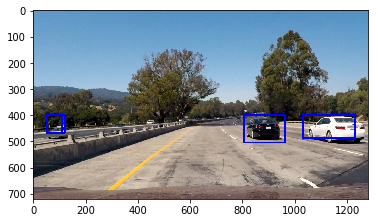

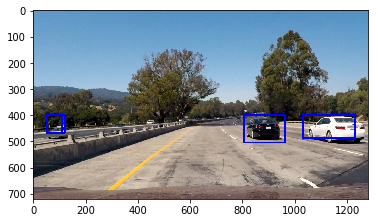

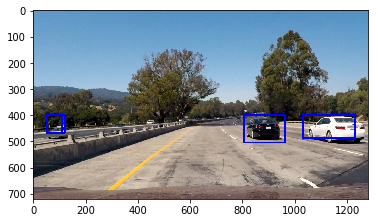

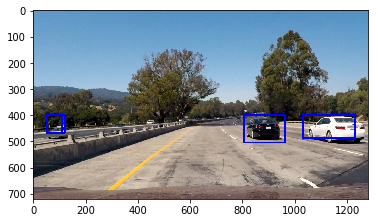

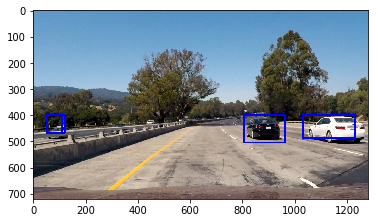

...

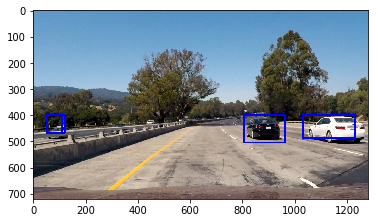

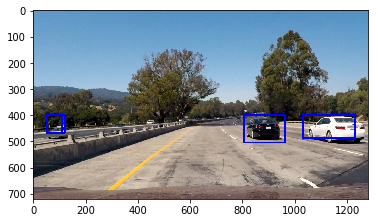

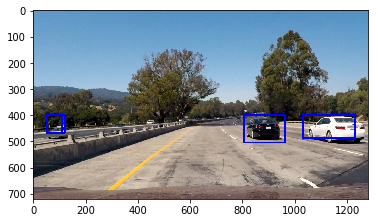

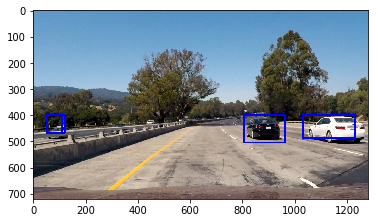

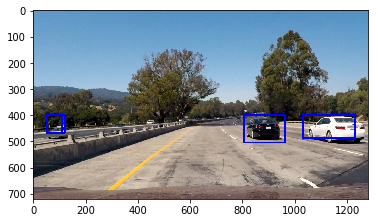

In [ ]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import moviepy as mve

output = '../out_project_video.mp4'
clip1 = VideoFileClip("../project_video.mp4")#.subclip(40,44)
out_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time out_clip.write_videofile(output, audio=False)